In [1]:
import pandas as pd
from sklearn import metrics
from sklearn.model_selection import train_test_split
import seaborn as sn
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report
import random
import shap
import xgboost
from matplotlib.patches import Patch

/home/jn/anaconda3/lib/python3.10/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
path = '../Dataset/'
data = pd.read_csv(path+'ALLFLOWMETER_HIKARI2021.csv')
data.head()

,Unnamed: 0.1,Unnamed: 0,uid,originh,originp,responh,responp,flow_duration,fwd_pkts_tot,bwd_pkts_tot,...,idle.min,idle.max,idle.tot,idle.avg,idle.std,fwd_init_window_size,bwd_init_window_size,fwd_last_window_size,traffic_category,Label
0,0,0,Cg61Jch3vdz9DBptj,103.255.15.23,13316,128.199.242.104,443,2.207588,15,14,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,29200,65160,0,Bruteforce-XML,1
1,1,1,CdRIlqLWdj35Y9vW9,103.255.15.23,13318,128.199.242.104,443,15.624266,15,14,...,1.534300e+07,1.534300e+07,1.534300e+07,1.534300e+07,0.0,29200,65160,0,Bruteforce-XML,1
2,2,2,CLzp9Khd0Y09Qkgrg,103.255.15.23,13320,128.199.242.104,443,12.203357,14,13,...,1.196814e+07,1.196814e+07,1.196814e+07,1.196814e+07,0.0,29200,65160,0,Bruteforce-XML,1
3,3,3,Cnf1YA4iLB4CSNWB88,103.255.15.23,13322,128.199.242.104,443,9.992448,14,13,...,9.759205e+06,9.759205e+06,9.759205e+06,9.759205e+06,0.0,29200,65160,0,Bruteforce-XML,1
4,4,4,C4ZKvv3fpO72EAOsJ6,103.255.15.23,13324,128.199.242.104,443,7.780611,14,14,...,7.545305e+06,7.545305e+06,7.545305e+06,7.545305e+06,0.0,29200,65160,0,Bruteforce-XML,1


In [3]:
len(data)

555278

In [4]:
data.traffic_category.value_counts()

traffic_category
Benign                 347431
Background             170151
Probing                 23388
Bruteforce               5884
Bruteforce-XML           5145
XMRIGCC CryptoMiner      3279
Name: count, dtype: int64

In [5]:
dic_map = {'Benign': 0, 'Background': 1, 'Probing': 2, 'Bruteforce': 3, 'Bruteforce-XML': 4, 'XMRIGCC CryptoMiner': 5}
data['traffic_category'] = data['traffic_category'].map(dic_map)

In [6]:
data.Label.value_counts()

Label
0    517582
1     37696
Name: count, dtype: int64

In [7]:
data = data[['originp'] + list(data.columns[6:])]
data.head()

,originp,responp,flow_duration,fwd_pkts_tot,bwd_pkts_tot,fwd_data_pkts_tot,bwd_data_pkts_tot,fwd_pkts_per_sec,bwd_pkts_per_sec,flow_pkts_per_sec,...,idle.min,idle.max,idle.tot,idle.avg,idle.std,fwd_init_window_size,bwd_init_window_size,fwd_last_window_size,traffic_category,Label
0,13316,443,2.207588,15,14,6,6,6.794746,6.341763,13.136509,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,29200,65160,0,4,1
1,13318,443,15.624266,15,14,6,6,0.960045,0.896042,1.856087,...,1.534300e+07,1.534300e+07,1.534300e+07,1.534300e+07,0.0,29200,65160,0,4,1
2,13320,443,12.203357,14,13,6,5,1.147225,1.065281,2.212506,...,1.196814e+07,1.196814e+07,1.196814e+07,1.196814e+07,0.0,29200,65160,0,4,1
3,13322,443,9.992448,14,13,6,5,1.401058,1.300983,2.702041,...,9.759205e+06,9.759205e+06,9.759205e+06,9.759205e+06,0.0,29200,65160,0,4,1
4,13324,443,7.780611,14,14,6,5,1.799345,1.799345,3.598689,...,7.545305e+06,7.545305e+06,7.545305e+06,7.545305e+06,0.0,29200,65160,0,4,1


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555278 entries, 0 to 555277
Data columns (total 83 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   originp                   555278 non-null  int64  
 1   responp                   555278 non-null  int64  
 2   flow_duration             555278 non-null  float64
 3   fwd_pkts_tot              555278 non-null  int64  
 4   bwd_pkts_tot              555278 non-null  int64  
 5   fwd_data_pkts_tot         555278 non-null  int64  
 6   bwd_data_pkts_tot         555278 non-null  int64  
 7   fwd_pkts_per_sec          555278 non-null  float64
 8   bwd_pkts_per_sec          555278 non-null  float64
 9   flow_pkts_per_sec         555278 non-null  float64
 10  down_up_ratio             555278 non-null  float64
 11  fwd_header_size_tot       555278 non-null  int64  
 12  fwd_header_size_min       555278 non-null  int64  
 13  fwd_header_size_max       555278 non-null  i

In [9]:
data.Label.value_counts()

Label
0    517582
1     37696
Name: count, dtype: int64

In [10]:
data.Label.value_counts()[1]

37696

In [11]:
print(len(data))

555278


In [12]:
train_data, test_data = train_test_split(data, random_state=42, test_size=0.2, shuffle=True)

In [13]:
# from imblearn.over_sampling import SMOTE

# sm = SMOTE(random_state = 42)
# X_train_oversampled, y_train_oversampled = sm.fit_resample(train_data[train_data.columns[:-2]], train_data[train_data.columns[-1]])
# # X_train = pd.DataFrame(X_train_oversampled, columns=X_train.columns)

In [14]:
# train_data = pd.concat([X_train_oversampled, y_train_oversampled], axis=1)

In [15]:
train_data.Label.value_counts()

Label
0    414022
1     30200
Name: count, dtype: int64

In [16]:
traf_val = train_data.traffic_category.value_counts()
traf_val

traffic_category
0    277938
1    136084
2     18713
3      4722
4      4137
5      2628
Name: count, dtype: int64

In [17]:
attack_df1 = train_data[train_data['Label']==1]
attack_df1 = attack_df1.sample(n=int(min(train_data.Label.value_counts())), random_state=42)

ben_df1 = train_data[train_data['Label']==0]
ben_df1 = ben_df1.sample(n=int(min(train_data.Label.value_counts())), random_state=42)

train_data = pd.concat([attack_df1, ben_df1], ignore_index=False)
train_data = train_data.sample(frac=1) #shuffling
len(train_data)

60400

In [18]:
# # , sampling_strategy = {0: traf_val[0]//3, 1: traf_val[1]//2.5, 2: traf_val[2]*2, 3: traf_val[3]*7, 4: traf_val[4]*7, 5: traf_val[5]*10 }
# from imblearn.over_sampling import SMOTE
# sm = SMOTE(random_state = 42, sampling_strategy = {2: traf_val[2]*2, 3: traf_val[3]*7, 4: traf_val[4]*7, 5: traf_val[5]*10 })

# X_train_res, y_train_res = sm.fit_resample(train_data[train_data.columns[:-2]], train_data[train_data.columns[-2]])


# from imblearn.under_sampling import RandomUnderSampler

# rus = RandomUnderSampler(random_state=42)

# X_train_res, y_train_res = rus.fit_resample(train_data[train_data.columns[:-2]], train_data[train_data.columns[-1]])


In [19]:

# print("After OverSampling, counts of label '0': {}".format(sum(y_train_res == 0)))
# print("After OverSampling, counts of label '1': {}".format(sum(y_train_res == 1)))
# print("After OverSampling, counts of label '2': {}".format(sum(y_train_res == 2)))
# print("After OverSampling, counts of label '3': {}".format(sum(y_train_res == 3)))
# print("After OverSampling, counts of label '4': {}".format(sum(y_train_res == 4)))
# print("After OverSampling, counts of label '5': {}".format(sum(y_train_res == 5)))


In [20]:
# y_train_res = np.array([0 if i<=1 else 1 for i in y_train_res])

In [21]:
train_data.traffic_category.value_counts()

traffic_category
0    20120
2    18713
1    10080
3     4722
4     4137
5     2628
Name: count, dtype: int64

In [22]:
attack_df1 = test_data[test_data['Label']==1]
attack_df1 = attack_df1.sample(n=test_data.Label.value_counts()[1], random_state=42)

ben_df1 = test_data[test_data['Label']==0]
ben_df1 = ben_df1.sample(n=test_data.Label.value_counts()[1], random_state=42)

test_data = pd.concat([attack_df1, ben_df1], ignore_index=False)
test_data = test_data.sample(frac=1) #shuffling
len(test_data)

14992

In [23]:
test_data.traffic_category.value_counts()

traffic_category
0    5054
2    4675
1    2442
3    1162
4    1008
5     651
Name: count, dtype: int64

In [24]:
test_data.Label.value_counts()

Label
0    7496
1    7496
Name: count, dtype: int64

In [25]:
# from sklearn.preprocessing import StandardScaler
# from sklearn.preprocessing import MinMaxScaler

# # scaler = StandardScaler()
# scaler = MinMaxScaler()

# for i in data.columns[:-2]:
#     data[i] = scaler.fit_transform(data[i].values.reshape(-1,1))

In [26]:
X_train, X_test, y_train, y_test = train_data[train_data.columns[:-2]], test_data[test_data.columns[:-2]], train_data[train_data.columns[-1]], test_data[test_data.columns[-1]] 
# X_train, X_test, y_train, y_test = X_train_res, test_data[test_data.columns[:-2]], y_train_res, test_data[test_data.columns[-1]] 

In [27]:
X_train, X_test, y_train, y_test = np.array(X_train), np.array(X_test), np.array(y_train), np.array(y_test) 

In [28]:
feature_names = train_data.columns[:-2]

In [29]:
unique_classes = ['Benign','Attack']

In [30]:
# from sklearn.tree import DecisionTreeClassifier 
  
# clfd = DecisionTreeClassifier(criterion ="entropy", max_depth = 4) 

# clfd_model = clfd.fit(X_train_res, y_train_res)
# clfd_predicted_values = clfd_model.predict(X_test)
# print(classification_report(y_test , clfd_predicted_values, target_names=unique_classes))

In [31]:
scale_pos_weight = (data['Label'].value_counts()[1]/data['Label'].value_counts()[0])**0.5 
scale_pos_weight

0.26987213956013084

In [32]:
xgb_classifier = xgboost.XGBClassifier(objective='binary:logistic', verbosity=2, n_estimators=100, max_depth=5)

In [33]:
xgb_model = xgb_classifier.fit(X_train, y_train)
xgb_predicted_values = xgb_model.predict(X_test)

In [34]:
print(classification_report(y_test , xgb_predicted_values, target_names=unique_classes))

              precision    recall  f1-score   support

      Benign       1.00      0.86      0.92      7496
      Attack       0.88      1.00      0.93      7496

    accuracy                           0.93     14992
   macro avg       0.94      0.93      0.93     14992
weighted avg       0.94      0.93      0.93     14992



In [35]:
print(metrics.accuracy_score(y_test, xgb_predicted_values))
print(metrics.precision_score(y_test, xgb_predicted_values, average='weighted'))
print(metrics.recall_score(y_test, xgb_predicted_values, average='weighted'))
print(metrics.f1_score(y_test, xgb_predicted_values, average='weighted'))

0.9286953041622199
0.9371919114074413
0.9286953041622199
0.9283471698877818


In [36]:
# from sklearn.model_selection import StratifiedKFold
# from sklearn.model_selection import cross_val_score, KFold

In [37]:
# X, y = data[data.columns[:-2]], data.Label

In [38]:
# num_folds = 5
# kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)
# skf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

In [39]:
# cross_val_results = cross_val_score(xgb_model, X, y, cv=kf)
# print(f'Cross-Validation Results (Accuracy): {cross_val_results}')
# print(f'Mean Accuracy: {cross_val_results.mean()}')

# # Cross-Validation Results (Accuracy): [0.92957607 0.92895476 0.93093574 0.92964747 0.92960245]
# # Mean Accuracy: 0.9297432993263242

In [40]:
# st_cross_val_results = cross_val_score(xgb_model, X, y, cv=skf)
# print(f'Stratified Cross-Validation Results (Accuracy): {st_cross_val_results}')
# print(f'Mean Accuracy: {st_cross_val_results.mean()}')

# # Stratified Cross-Validation Results (Accuracy): [0.92946802 0.92960308 0.92938698 0.93072802 0.92958444]
# # Mean Accuracy: 0.9297541065992974

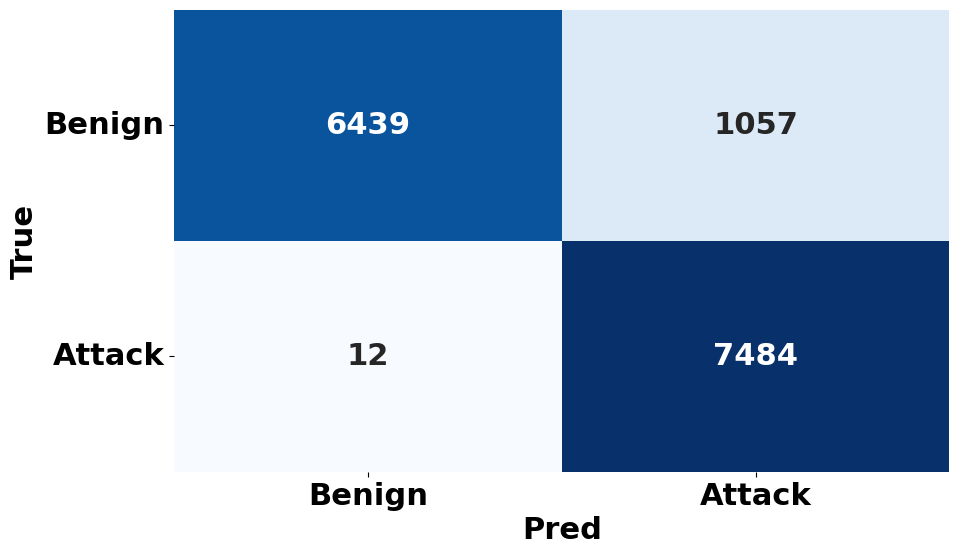

In [87]:
xgb_cm = metrics.confusion_matrix(y_test, xgb_predicted_values)

fig, ax = plt.subplots()
sn.heatmap(xgb_cm, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues,
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=unique_classes,
       yticklabels=unique_classes)
plt.rcParams["figure.figsize"] = (10,6)
plt.yticks(rotation=0)
plt.rcParams.update({'font.size': 22,'font.weight':'bold'})
plt.show()


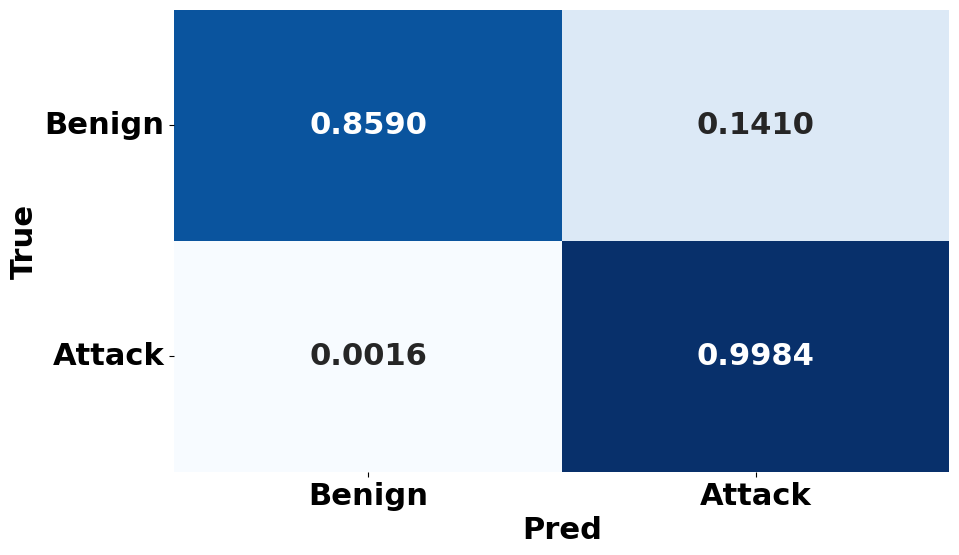

In [42]:
cm = xgb_cm.astype('float') / xgb_cm.sum(axis=1)[:, np.newaxis]

fig, ax = plt.subplots()
sn.heatmap(cm, annot=True, fmt='.4f', xticklabels=unique_classes,
       yticklabels=unique_classes, cmap=plt.cm.Blues,
            cbar=False)
plt.rcParams["figure.figsize"] = (10,6)
plt.yticks(rotation=0)
plt.ylabel('True')
plt.xlabel('Pred')
plt.show(block=False)

In [ ]:
def calculate_fpr_fnr(confusion_matrix):
    """
    Calculate and print the False Positive Rate (FPR) and False Negative Rate (FNR) from a confusion matrix.

    Parameters:
    - confusion_matrix: 2D array-like, the confusion matrix

    Returns:
    - FPR: False Positive Rate
    - FNR: False Negative Rate
    """
    # Extract TN, FP, FN, and TP from the confusion matrix
    TN, FP, FN, TP = confusion_matrix.ravel()

    # Calculate FPR and FNR
    FPR = FP / (FP + TN)
    FNR = FN / (FN + TP)

    # Print FPR and FNR
    print(f"False Positive Rate (FPR): {FPR:.4f}")
    print(f"False Negative Rate (FNR): {FNR:.4f}")
    
    return FPR, FNR



# Confusion matrix values
# xgb_cm = np.array([[219483, 265], [1122, 218626]])

calculate_fpr_fnr(xgb_cm)

# Calculate normalized values for each cell
normalized_cm = xgb_cm.astype('float') / xgb_cm.sum(axis=1)[:, np.newaxis]

# Combine values and normalized values into one string for annotation
annot = np.empty_like(xgb_cm).astype(str)
for i in range(xgb_cm.shape[0]):
    for j in range(xgb_cm.shape[1]):
        annot[i, j] = f"{xgb_cm[i, j]}\n({normalized_cm[i, j]:.2%})"

fig, ax = plt.subplots()
sn.heatmap(xgb_cm, annot=annot, fmt='', ax=ax, cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=unique_classes, yticklabels=unique_classes)
plt.rcParams["figure.figsize"] = (10, 6)
plt.yticks(rotation=0)
plt.rcParams.update({'font.size': 22, 'font.weight': 'bold'})
plt.show()


In [43]:
# Get predicted probabilities for the positive class
y_prob = xgb_model.predict_proba(X_test)[:,1]
# Calculate Brier score for binary classification
brier_score_pos = metrics.brier_score_loss(y_test, y_prob)
print(f'Brier score (binary): {brier_score_pos:.4f}')

Brier score (binary): 0.0614


In [44]:
# from sklearn.calibration import CalibratedClassifierCV

# calibrated_model = CalibratedClassifierCV(base_estimator=xgb_model, method='isotonic')
# calibrated_model.fit(X_train, y_train)

In [45]:
# from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score

# # Predict probabilities and classes
# y_prob = calibrated_model.predict_proba(X_test)[:, 1]
# y_pred = calibrated_model.predict(X_test)

# # Calculate metrics
# roc_auc = roc_auc_score(y_test, y_prob)
# accuracy = accuracy_score(y_test, y_pred)
# precision = precision_score(y_test, y_pred)
# recall = recall_score(y_test, y_pred)
# f1 = f1_score(y_test, y_pred)

# print(f"ROC AUC: {roc_auc:.4f}")
# print(f"Accuracy: {accuracy:.4f}")
# print(f"Precision: {precision:.4f}")
# print(f"Recall: {recall:.4f}")
# print(f"F1 Score: {f1:.4f}")


In [46]:
# from sklearn.metrics import precision_recall_curve, roc_curve

# # Precision-Recall curve
# precision, recall, thresholds = precision_recall_curve(y_test, y_prob)
# plt.plot(recall, precision, marker='.')
# plt.xlabel('Recall')
# plt.ylabel('Precision')
# plt.title('Precision-Recall Curve')
# plt.show()

# # ROC curve
# fpr, tpr, _ = roc_curve(y_test, y_prob)
# plt.plot(fpr, tpr, marker='.')
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('ROC Curve')
# plt.show()

In [47]:
# optimal_idx = np.argmax(precision + recall)
# optimal_threshold = thresholds[optimal_idx]

# # Predict classes based on the new threshold
# y_pred_adjusted = (y_prob >= optimal_threshold).astype(int)

# # Calculate metrics for the adjusted threshold
# precision_adj = precision_score(y_test, y_pred_adjusted)
# recall_adj = recall_score(y_test, y_pred_adjusted)
# f1_adj = f1_score(y_test, y_pred_adjusted)

# print(f"Adjusted Precision: {precision_adj:.4f}")
# print(f"Adjusted Recall: {recall_adj:.4f}")
# print(f"Adjusted F1 Score: {f1_adj:.4f}")

              precision    recall  f1-score   support

      Benign       1.00      0.84      0.91      7496
      Attack       0.86      1.00      0.92      7496

    accuracy                           0.92     14992
   macro avg       0.93      0.92      0.92     14992
weighted avg       0.93      0.92      0.92     14992

0.9186899679829242
0.9300248111245172
0.9186899679829242
0.9181506095681423
Brier score (binary): 0.0708


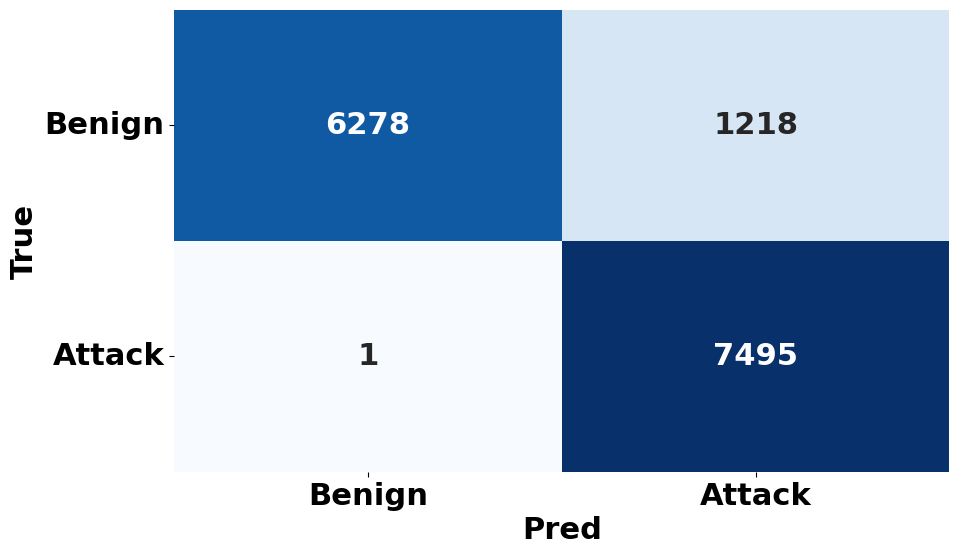

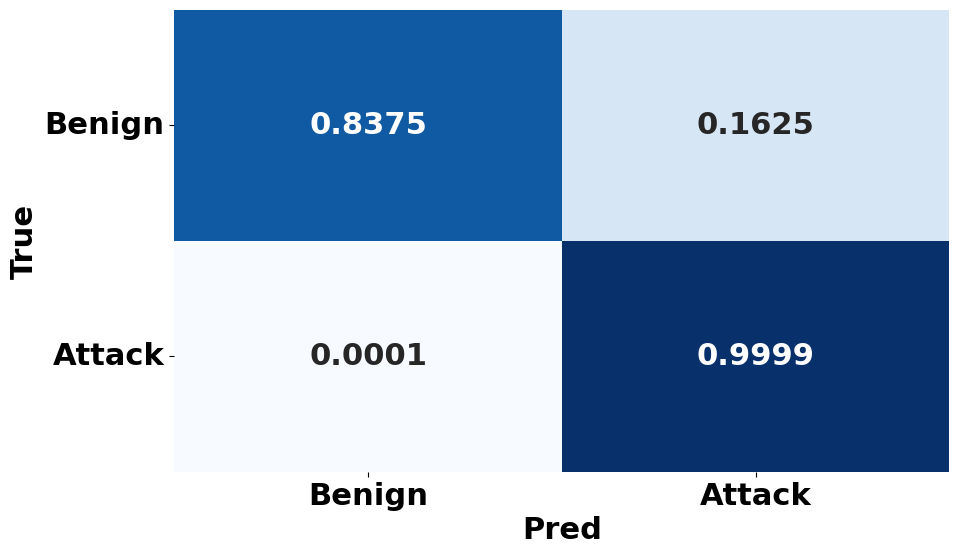

In [48]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier(max_depth=5, random_state=42)
rf_model = rf_clf.fit(X_train, y_train)
rf_predicted_values = rf_model.predict(X_test)


print(classification_report(y_test , rf_predicted_values, target_names=unique_classes))

print(metrics.accuracy_score(y_test, rf_predicted_values))
print(metrics.precision_score(y_test, rf_predicted_values, average='weighted'))
print(metrics.recall_score(y_test, rf_predicted_values, average='weighted'))
print(metrics.f1_score(y_test, rf_predicted_values, average='weighted'))



# Calculate multiclass Brier score
y_prob_rf = rf_clf.predict_proba(X_test)[:,1]
# Calculate Brier score for binary classification
brier_score_pos = metrics.brier_score_loss(y_test, y_prob_rf)
print(f'Brier score (binary): {brier_score_pos:.4f}')



rf_cm = metrics.confusion_matrix(y_test, rf_predicted_values)

fig, ax = plt.subplots()
sn.heatmap(rf_cm, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues,
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=unique_classes,
       yticklabels=unique_classes)
plt.rcParams["figure.figsize"] = (10,6)
plt.yticks(rotation=0)
plt.rcParams.update({'font.size': 22,'font.weight':'bold'})
plt.show()


cm = rf_cm.astype('float') / rf_cm.sum(axis=1)[:, np.newaxis]

fig, ax = plt.subplots()
sn.heatmap(cm, annot=True, fmt='.4f', xticklabels=unique_classes,
       yticklabels=unique_classes, cmap=plt.cm.Blues,
            cbar=False)
plt.rcParams["figure.figsize"] = (10,6)
plt.yticks(rotation=0)
plt.ylabel('True')
plt.xlabel('Pred')
plt.show(block=False)


              precision    recall  f1-score   support

      Benign       1.00      0.83      0.91      7496
      Attack       0.85      1.00      0.92      7496

    accuracy                           0.91     14992
   macro avg       0.93      0.91      0.91     14992
weighted avg       0.93      0.91      0.91     14992

0.9149546424759872
0.9271977900922971
0.9149546424759872
0.91434091220816
Brier score (binary): 0.0726


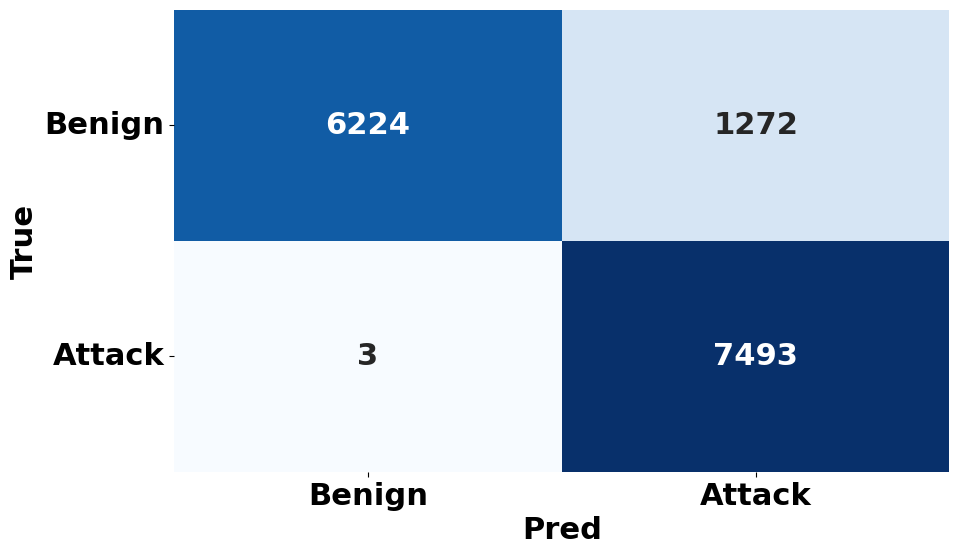

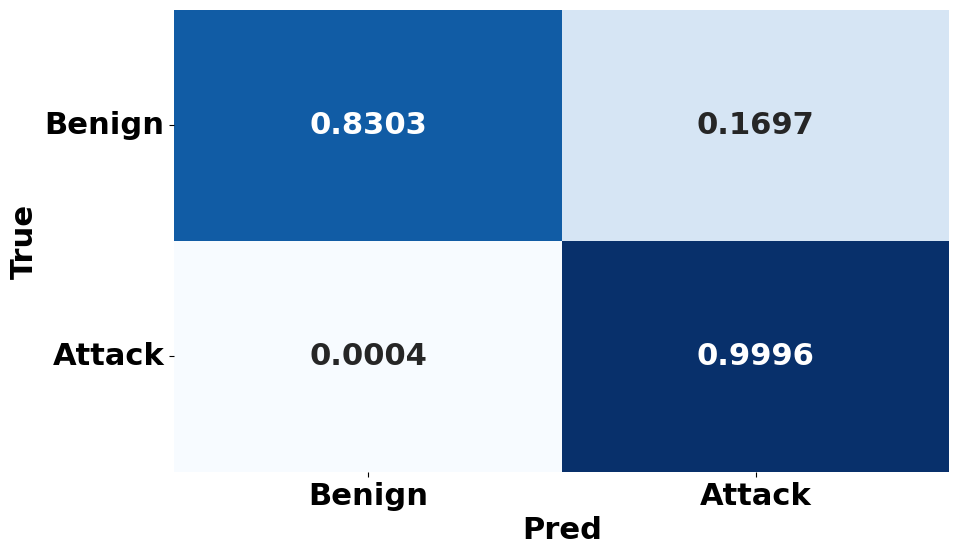

In [49]:
from sklearn.tree import DecisionTreeClassifier

dt_clf = DecisionTreeClassifier(max_depth=5, random_state=42)
dt_model = dt_clf.fit(X_train, y_train)
dt_predicted_values = dt_model.predict(X_test)


print(classification_report(y_test , dt_predicted_values, target_names=unique_classes))

print(metrics.accuracy_score(y_test, dt_predicted_values))
print(metrics.precision_score(y_test, dt_predicted_values, average='weighted'))
print(metrics.recall_score(y_test, dt_predicted_values, average='weighted'))
print(metrics.f1_score(y_test, dt_predicted_values, average='weighted'))



# Calculate multiclass Brier score
y_prob_dt = dt_clf.predict_proba(X_test)[:,1]
# Calculate Brier score for binary classification
brier_score_pos = metrics.brier_score_loss(y_test, y_prob_dt)
print(f'Brier score (binary): {brier_score_pos:.4f}')



dt_cm = metrics.confusion_matrix(y_test, dt_predicted_values)

fig, ax = plt.subplots()
sn.heatmap(dt_cm, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues,
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=unique_classes,
       yticklabels=unique_classes)
plt.rcParams["figure.figsize"] = (10,6)
plt.yticks(rotation=0)
plt.rcParams.update({'font.size': 22,'font.weight':'bold'})
plt.show()



cm = dt_cm.astype('float') / dt_cm.sum(axis=1)[:, np.newaxis]

fig, ax = plt.subplots()
sn.heatmap(cm, annot=True, fmt='.4f', xticklabels=unique_classes,
       yticklabels=unique_classes, cmap=plt.cm.Blues,
            cbar=False)
plt.rcParams["figure.figsize"] = (10,6)
plt.yticks(rotation=0)
plt.ylabel('True')
plt.xlabel('Pred')
plt.show(block=False)


In [50]:
print(len(y_test),len(xgb_predicted_values))

14992 14992


In [51]:
# tp_instances = np.where((y_test == 1) & (xgb_predicted_values == 1))[0]
# tn_instances = np.where((y_test == 0) & (xgb_predicted_values == 0))[0]
# fp_instances = np.where((y_test == 0) & (xgb_predicted_values == 1))[0]
# fn_instances = np.where((y_test == 1) & (xgb_predicted_values == 0))[0]

tp_instances, tn_instances, fp_instances, fn_instances = [],[],[],[]

for i in range(len(y_test)):
    if y_test[i]==1:
        if xgb_predicted_values[i]==1:
            tp_instances.append(i)
        else:
            fn_instances.append(i)
    
    else:
        if xgb_predicted_values[i]==0:
            tn_instances.append(i)
        else:
            fp_instances.append(i)

tp_instances = np.array(tp_instances)
tn_instances = np.array(tn_instances)
fp_instances = np.array(fp_instances)
fn_instances = np.array(fn_instances)

print(len(tp_instances), len(tn_instances), len(fp_instances),len(fn_instances))

7484 6439 1057 12


In [52]:
print(len([x for x in y_prob[tp_instances] if x>=0.70])*100/len(tp_instances))
print(len([x for x in y_prob[tn_instances] if x<=0.30])*100/len(tn_instances))
print(len([x for x in y_prob[fp_instances] if x>=0.70])*100/len(fp_instances))
print(len([x for x in y_prob[fn_instances] if x<=0.30])*100/len(fn_instances))

96.95350080171032
99.5962105917068
92.2421948912015
25.0


In [53]:
print(len([x for x in y_prob[tp_instances] if x>=0.75])*100/len(tp_instances))
print(len([x for x in y_prob[tn_instances] if x<=0.25])*100/len(tn_instances))
print(len([x for x in y_prob[fp_instances] if x>=0.75])*100/len(fp_instances))
print(len([x for x in y_prob[fn_instances] if x<=0.25])*100/len(fn_instances))

92.55745590593266
99.56514986799192
84.95742667928099
16.666666666666668


In [54]:
print(len([x for x in y_prob[tp_instances] if x>=0.80])*100/len(tp_instances))
print(len([x for x in y_prob[tn_instances] if x<=0.20])*100/len(tn_instances))
print(len([x for x in y_prob[fp_instances] if x>=0.80])*100/len(fp_instances))
print(len([x for x in y_prob[fn_instances] if x<=0.20])*100/len(fn_instances))

82.38909673971139
99.51855878241963
68.11731315042573
16.666666666666668


In [55]:
print(len([x for x in y_prob[tp_instances] if x>=0.85])*100/len(tp_instances))
print(len([x for x in y_prob[tn_instances] if x<=0.15])*100/len(tn_instances))
print(len([x for x in y_prob[fp_instances] if x>=0.85])*100/len(fp_instances))
print(len([x for x in y_prob[fn_instances] if x<=0.15])*100/len(fn_instances))

66.5820416889364
99.44090697313247
45.88457899716178
16.666666666666668


In [56]:
print(len([x for x in y_prob[tp_instances] if x>=0.90])*100/len(tp_instances))
print(len([x for x in y_prob[tn_instances] if x<=0.1])*100/len(tn_instances))
print(len([x for x in y_prob[fp_instances] if x>=0.90])*100/len(fp_instances))
print(len([x for x in y_prob[fn_instances] if x<=0.1])*100/len(fn_instances))

47.822020309994656
99.28560335455816
29.706717123935668
16.666666666666668


In [57]:
tp_tn_random_size = min(len(tp_instances), len(tn_instances))
fp_fn_random_size = min(len(fp_instances), len(fn_instances))

In [58]:
def plot_overlapping_shap(shap_values_instance1, shap_values_instance2, feature_names, feature_values, label_exp, raw_prediction_prob=None, pred_val=None, color_instance1=None, color_instance2=None, bar_width1=0.75, bar_width2=0.9):
    """
    Plot two overlapping SHAP bar plots for two instances.

    Parameters:
    - shap_values_instance1: 1D array-like, SHAP values for the first instance.
    - shap_values_instance2: 1D array-like, SHAP values for the second instance.
    - feature_names: list of feature names.
    - feature_values: list of feature values.
    - label_exp: label for the second instance.
    - raw_prediction_prob: Probability of the prediction to be displayed as text.
    - pred_val: Prediction value to be displayed as text.
    - color_instance1: tuple or list of colors for the first instance, default to bright colors.
    - color_instance2: tuple or list of colors for the second instance, default to transparent colors.
    - bar_width1: width of the bars for the first instance.
    - bar_width2: width of the bars for the second instance.
    """
    
    light_red, light_green = (1.0, 0.71, 0.71, 0.5), (0.56, 0.93, 0.56, 0.5)  # Light orange

    # Default colors
    if color_instance1 is None:
        color_instance1 = ['deepskyblue' if v < 0 else 'deeppink' for v in shap_values_instance1]
    if color_instance2 is None:
        color_instance2 = [light_green if v < 0 else light_red for v in shap_values_instance2]

    # Convert inputs to numpy arrays
    shap_values_instance1 = np.array(shap_values_instance1)
    shap_values_instance2 = np.array(shap_values_instance2)
    
    # Ensure the inputs are of the same length
    assert len(shap_values_instance1) == len(shap_values_instance2) == len(feature_names) == len(feature_values), \
        "All inputs must have the same length"

    # Create y-tick labels with feature values
    feature_labels = [f"{name} = {round(value, 4)}" for name, value in zip(feature_names, feature_values)]

    # Plotting
    fig, ax = plt.subplots()

    # Bar plot for the first instance
    bar1 = ax.barh(np.arange(len(feature_names)), shap_values_instance1, height=bar_width1, color=color_instance1, label='Instance 1')

    # Bar plot for the second instance with different width and transparency
    bar2 = ax.barh(np.arange(len(feature_names)), shap_values_instance2, height=bar_width2, color=color_instance2, label=label_exp)

    # Adding feature names with values as y-axis labels
    ax.set_yticks(np.arange(len(feature_names)))
    ax.set_yticklabels(feature_labels)

    # Adding labels and title
    ax.set_xlabel('SHAP value')

    # Add text for raw_prediction_prob and pred_val if provided
    title_text = ""
    if pred_val is not None:
        if int(pred_val) == 0:
            if raw_prediction_prob is not None:
                title_text += f"Raw Prediction Probability: {1-raw_prediction_prob:.3f}\n"
                title_text += f"Prediction Value: {pred_val:.0f}"
        else:
            if raw_prediction_prob is not None:
                title_text += f"Raw Prediction Probability: {raw_prediction_prob:.3f}\n"
                title_text += f"Prediction Value: {pred_val:.0f}"
    plt.title(title_text.strip())

    # Custom legend
    legend_elements = [
        Patch(facecolor='deeppink', edgecolor='deeppink', label='Instance 1 (positive)'),
        Patch(facecolor='deepskyblue', edgecolor='deepskyblue', label='Instance 1 (negative)'),
        Patch(facecolor=light_red, edgecolor=light_red, label=f'{label_exp} (positive)'),
        Patch(facecolor=light_green, edgecolor=light_green, label=f'{label_exp} (negative)')
    ]
    ax.legend(handles=legend_elements)
    
    # plt.show()


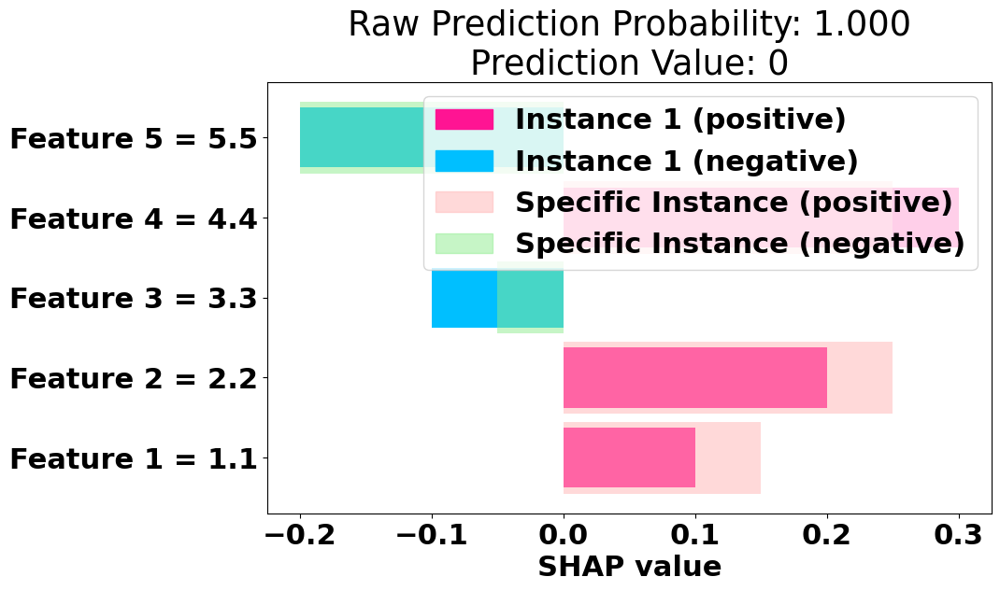

In [59]:
shap_values_instance1 = [0.1, 0.2, -0.1, 0.3, -0.2]
shap_values_instance2 = [0.15, 0.25, -0.05, 0.25, -0.2]
f_names = ['Feature 1', 'Feature 2', 'Feature 3', 'Feature 4', 'Feature 5']
feature_values = [1.1, 2.2, 3.3, 4.4, 5.5]
label_exp = 'Specific Instance'

plot_overlapping_shap(shap_values_instance1, shap_values_instance2, f_names, feature_values, label_exp, raw_prediction_prob=0.0, pred_val=0)


In [60]:
def top_20_features(shap_value_group):
    abs_shap_values = np.abs(shap_value_group)
    top_20_indices = np.argsort(abs_shap_values)[-20:]
    
    # Sort these indices based on the original absolute values in ascending order
    sorted_top_20_indices = top_20_indices[np.argsort(abs_shap_values[top_20_indices])]
    
    return sorted_top_20_indices

In [61]:
explainer = shap.TreeExplainer(xgb_classifier, X_train)
tp_shap_values = explainer(X_test[tp_instances],check_additivity=False)

 97%|=================== | 7223/7484 [00:19<00:00]       

In [62]:
# tp_shap_values[0]

In [63]:
# top_20_features(tp_shap_values.values.mean(0))
# data.columns[60]

In [64]:
tp_shap_values.shape

(7484, 81)

In [65]:
feature_names = train_data.columns[:-2]

In [66]:
tp_shap_values.feature_names = feature_names

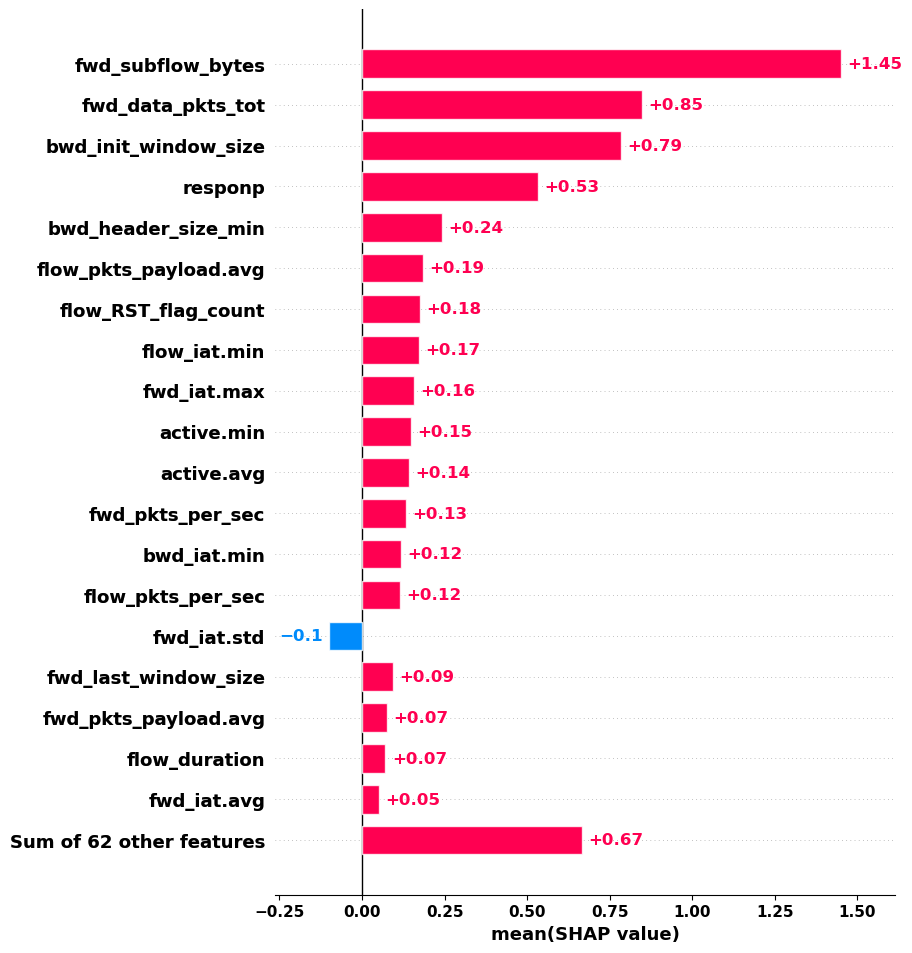

In [67]:
shap.plots.bar(tp_shap_values.mean(0),max_display=20)

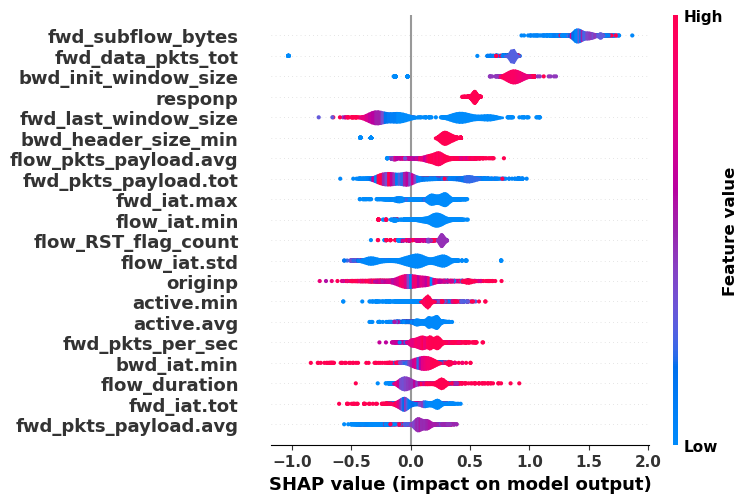

In [68]:
shap.summary_plot(tp_shap_values, plot_type="violin", class_names=unique_classes, plot_size=0.2,max_display=20)

In [69]:
tp_shap_values_mean = tp_shap_values.values.mean(0)
tp_top_20_features = top_20_features(tp_shap_values_mean)
tp_top_20_features

array([ 0, 45,  2, 30, 80, 46,  9, 47,  7, 71, 68, 43, 52, 19, 40, 15,  1,
       79,  5, 60])

6762


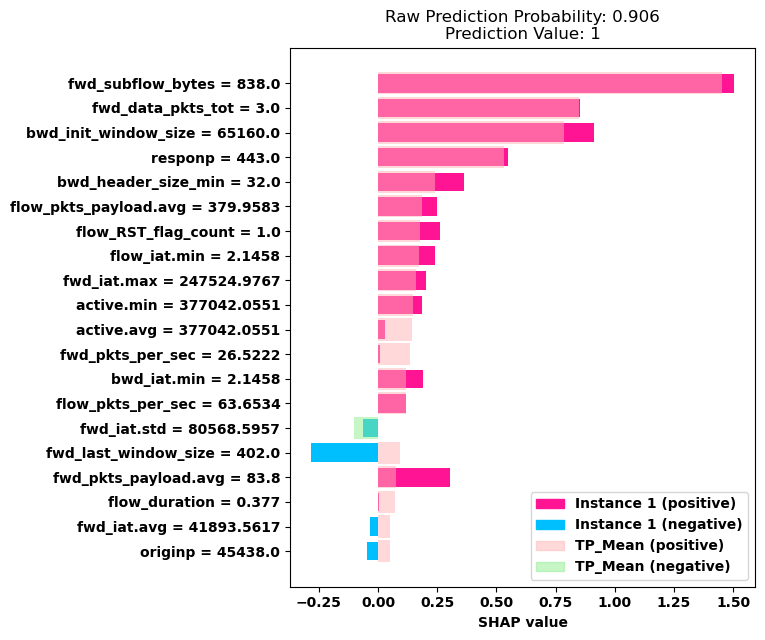

In [95]:
# tp_random_case = tp_shap_values[random.randrange(tp_tn_random_size-1)]
rand_idx = random.choice(tp_instances)
print(rand_idx)
tp_random_case = explainer(X_test[rand_idx])
# top_20_indices = lambda array: np.argsort(np.abs(array))[-20:]
# tp_top_20_features = top_20_indices(tp_random_case.values)
# print(tp_random_case[tp_top_20_features].values)
# print(tp_random_case.values[tp_top_20_features])
plot_overlapping_shap(tp_random_case.values[tp_top_20_features], tp_shap_values_mean[tp_top_20_features], feature_names[tp_top_20_features], tp_random_case.data[tp_top_20_features], 'TP_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
plt.rcParams["figure.figsize"] = (6,7)
plt.yticks(rotation=0)
plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
plt.show()

In [71]:
# shap.plots.waterfall(tp_random_case,max_display=15)

In [72]:
# randi = [random.randrange(tp_tn_random_size-1) for i in range(3)]

# for i in randi:
#     shap.plots.waterfall(tp_shap_values[i],max_display=15)

 97%|=================== | 6261/6439 [00:14<00:00]       

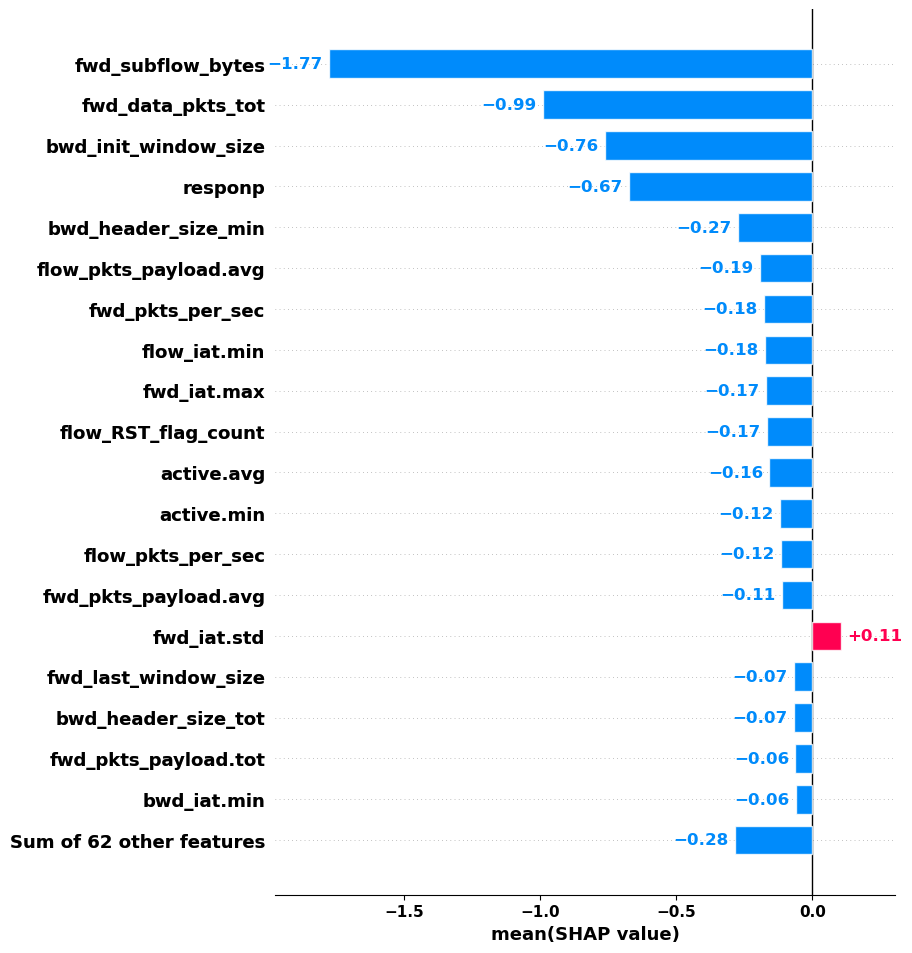

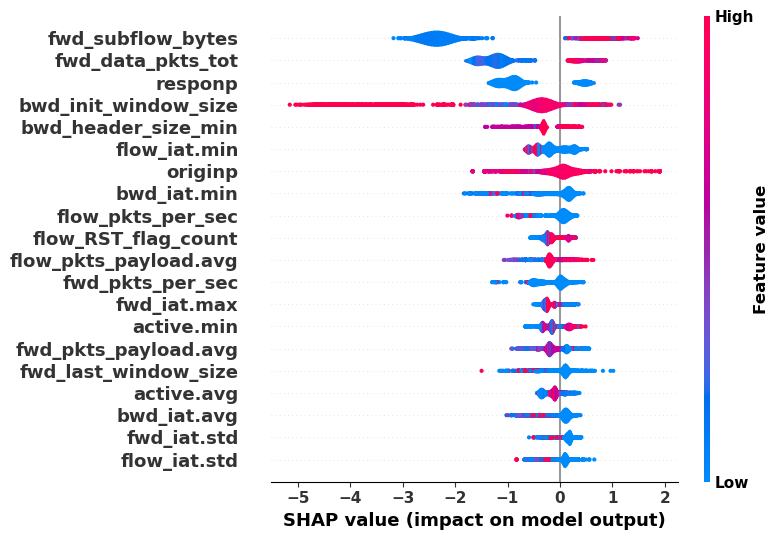

In [73]:
tn_shap_values = explainer(X_test[tn_instances],check_additivity=False)

tn_shap_values.feature_names = train_data.columns[:-2]

shap.plots.bar(tn_shap_values.mean(0),max_display=20)

shap.summary_plot(tn_shap_values, plot_type="violin", class_names=unique_classes, plot_size=0.2,max_display=20)

# randi = [random.randrange(tp_tn_random_size-1) for i in range(3)]

# for i in randi:
#     shap.plots.waterfall(tn_shap_values[i],max_display=15)

In [74]:
tn_shap_values_mean = tn_shap_values.values.mean(0)
tn_top_20_features = top_20_features(tn_shap_values_mean)
tn_top_20_features

array([36, 47, 29, 14, 80, 46, 30,  9, 68, 71, 19, 43, 52,  7, 40, 15,  1,
       79,  5, 60])

1512


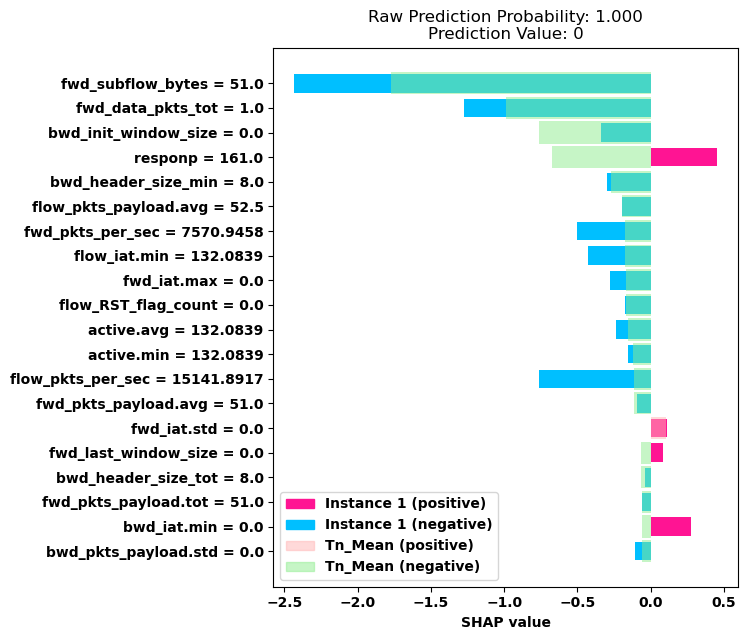

In [75]:
# tn_random_case = tn_shap_values[random.randrange(tp_tn_random_size-1)]
rand_idx = random.choice(tn_instances)
print(rand_idx)
tn_random_case = explainer(X_test[rand_idx])
# top_20_indices = lambda array: np.argsort(np.abs(array))[-20:]
# tn_top_20_features = top_20_indices(tn_random_case.values)
# print(tn_random_case[tn_top_20_features].values)
# print(tn_random_case.values[tn_top_20_features])
plot_overlapping_shap(tn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'Tn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
plt.rcParams["figure.figsize"] = (6,7)
plt.yticks(rotation=0)
plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
plt.show()

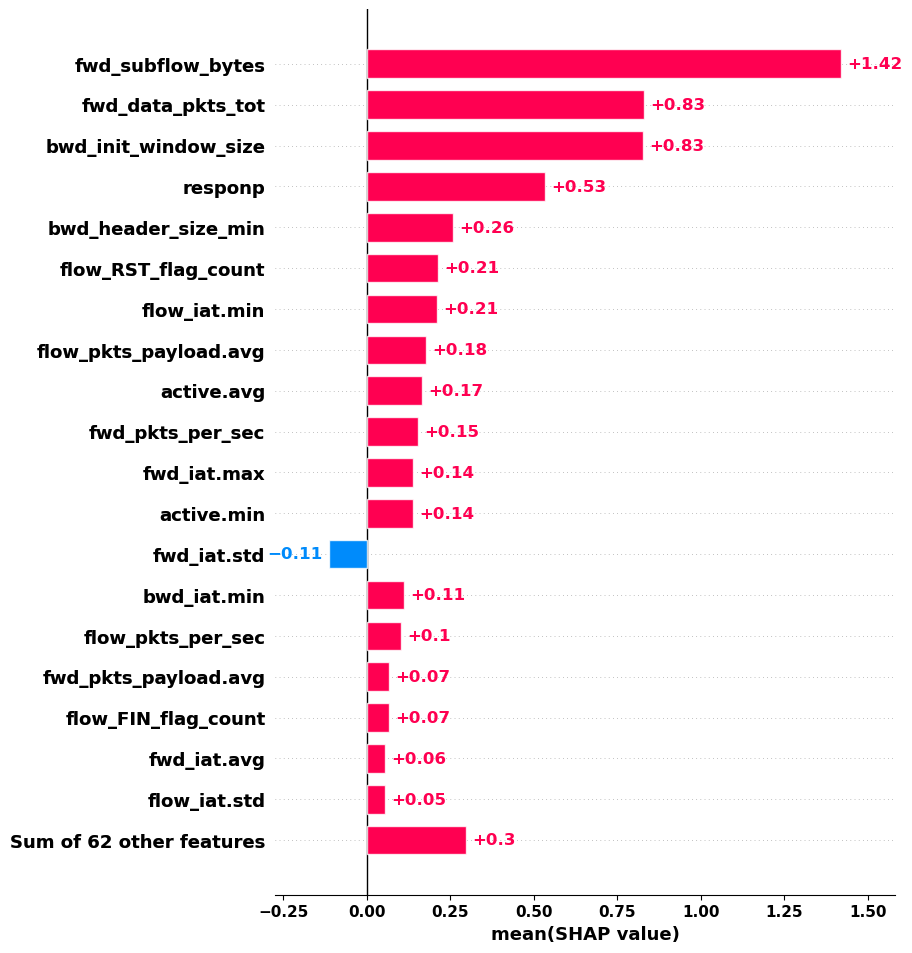

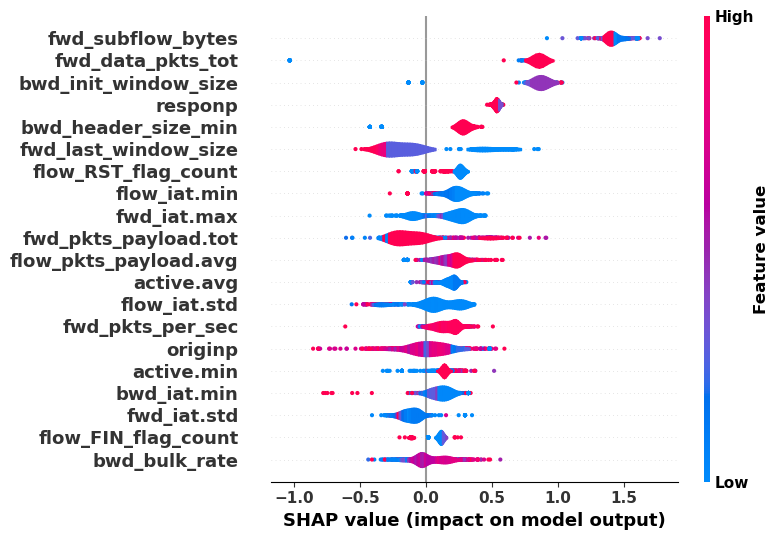

In [76]:
fp_shap_values = explainer(X_test[fp_instances],check_additivity=False)

fp_shap_values.feature_names = train_data.columns[:-2]

shap.plots.bar(fp_shap_values.mean(0),max_display=20)

shap.summary_plot(fp_shap_values, plot_type="violin", class_names=unique_classes, plot_size=0.2,max_display=20)

# randi = [random.randrange(fp_fn_random_size-1) for i in range(3)]

# for i in randi:
#     shap.plots.waterfall(fp_shap_values[i],max_display=15)

In [77]:
fp_shap_values_mean = fp_shap_values.values.mean(0)
fp_top_20_features = top_20_features(fp_shap_values_mean)
fp_top_20_features

array([29, 56, 45, 17, 30,  9, 47, 46, 68, 43,  7, 71, 40, 52, 19, 15,  1,
       79,  5, 60])

5400


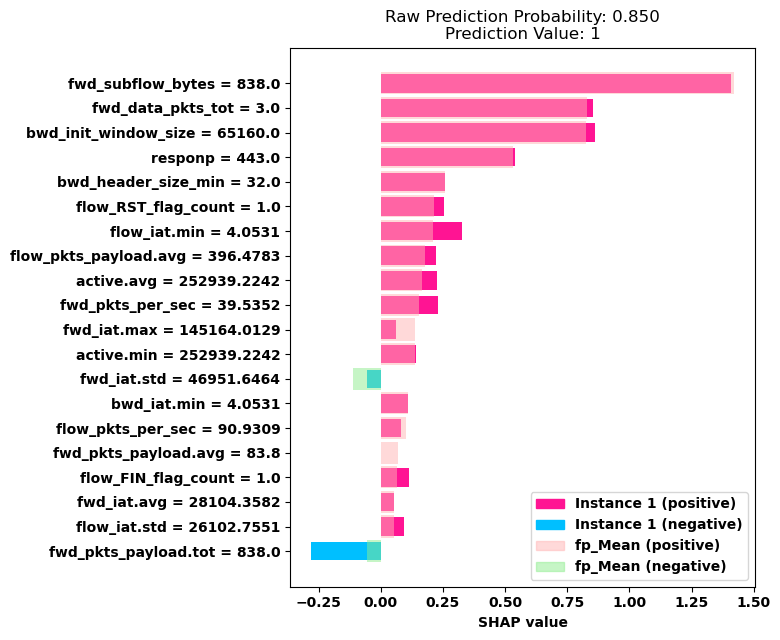

In [78]:
# fp_random_case = fp_shap_values[random.randrange(fp_fn_random_size-1)]
rand_idx = random.choice(fp_instances)
print(rand_idx)
fp_random_case = explainer(X_test[rand_idx])
# top_20_indices = lambda array: np.argsort(np.abs(array))[-20:]
# fp_top_20_features = top_20_indices(fp_random_case.values)
# print(fp_random_case[fp_top_20_features].values)
# print(fp_random_case.values[fp_top_20_features])
plot_overlapping_shap(fp_random_case.values[fp_top_20_features], fp_shap_values_mean[fp_top_20_features], feature_names[fp_top_20_features], fp_random_case.data[fp_top_20_features], 'fp_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
plt.rcParams["figure.figsize"] = (6,7)
plt.yticks(rotation=0)
plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
plt.show()

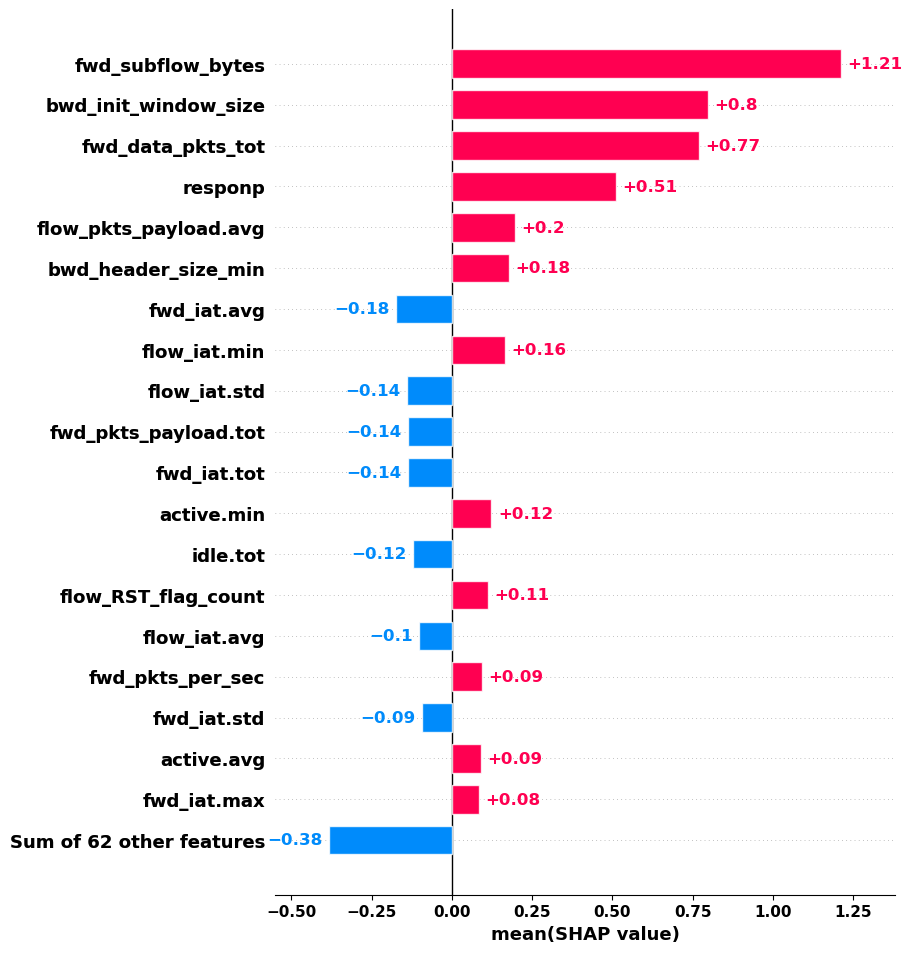

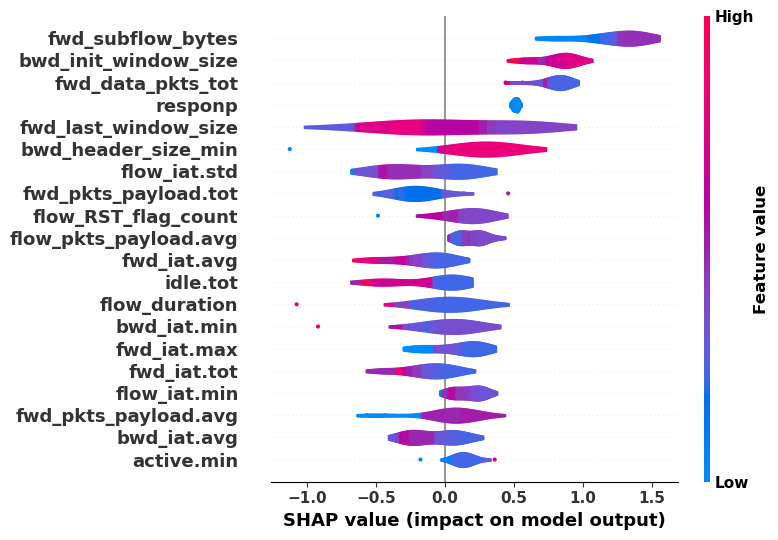

In [79]:
fn_shap_values = explainer(X_test[fn_instances],check_additivity=False)

fn_shap_values.feature_names = train_data.columns[:-2]

shap.plots.bar(fn_shap_values.mean(0),max_display=20)

shap.summary_plot(fn_shap_values, plot_type="violin", class_names=unique_classes, plot_size=0.2,max_display=20)

# randi = [random.randrange(fp_fn_random_size-1) for i in range(3)]

# for i in randi:
#     shap.plots.waterfall(fn_shap_values[i],max_display=15)

In [80]:
fn_shap_values_mean = fn_shap_values.values.mean(0)
fn_top_20_features = top_20_features(fn_shap_values_mean)
fn_top_20_features

array([50, 43, 71, 46,  7, 55, 19, 75, 68, 44, 29, 56, 52, 45, 15, 40,  1,
        5, 79, 60])

4368


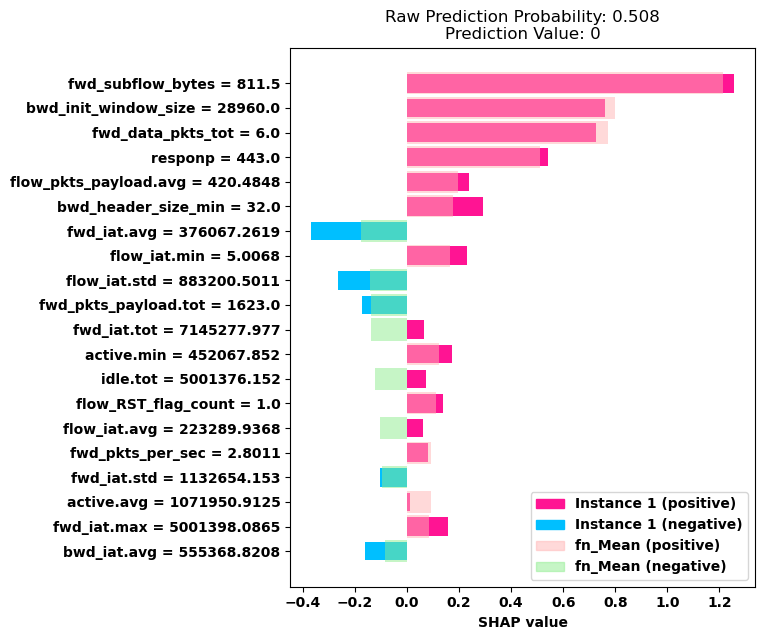

In [81]:
# fn_random_case = fn_shap_values[random.randrange(fp_fn_random_size-1)]
rand_idx = random.choice(fn_instances)
print(rand_idx)
fn_random_case = explainer(X_test[rand_idx])
# top_20_indices = lambda array: np.argsort(np.abs(array))[-20:]
# fn_top_20_features = top_20_indices(fn_random_case.values)
# print(fn_random_case[fn_top_20_features].values)
# print(fn_random_case.values[fn_top_20_features])
plot_overlapping_shap(fn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], fn_random_case.data[fn_top_20_features], 'fn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
plt.rcParams["figure.figsize"] = (6,7)
plt.yticks(rotation=0)
plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
plt.show()

------------------------------------------------------------------------------------------------------------------------------------------------------


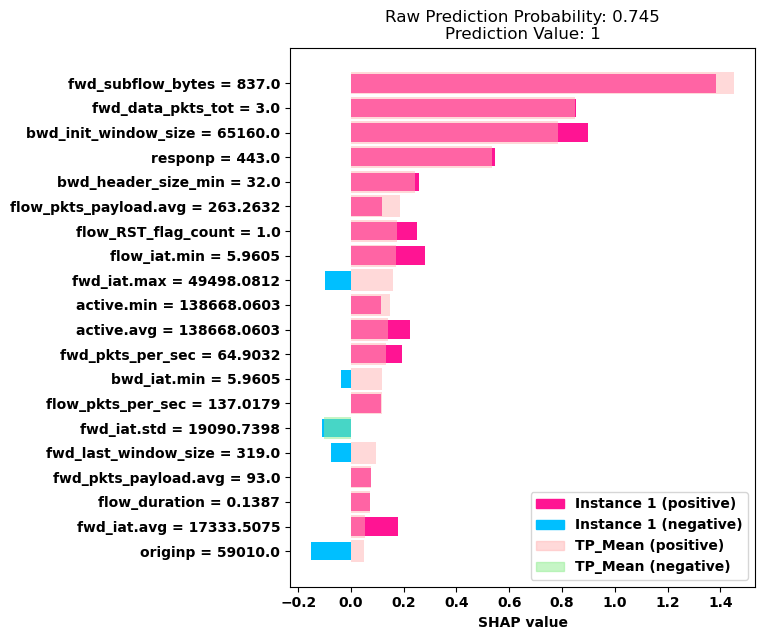

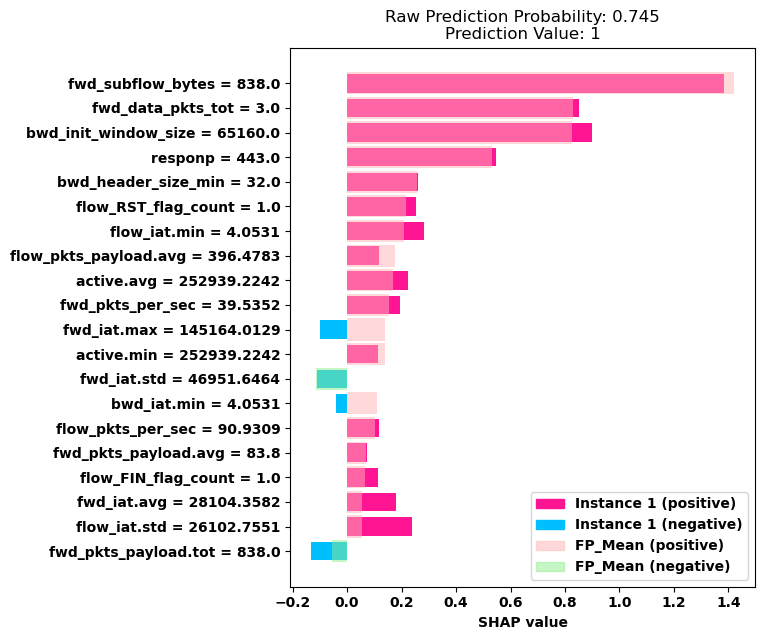

------------------------------------------------------------------------------------------------------------------------------------------------------


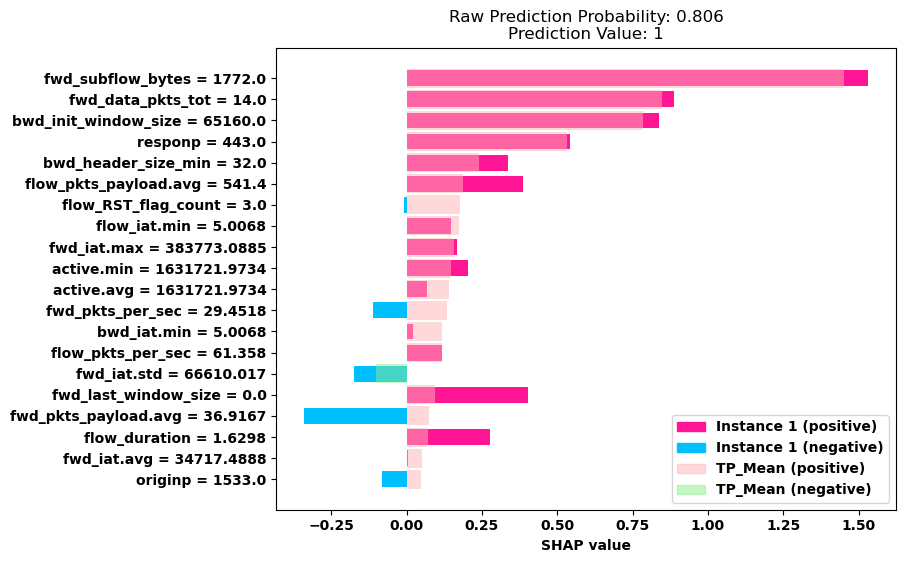

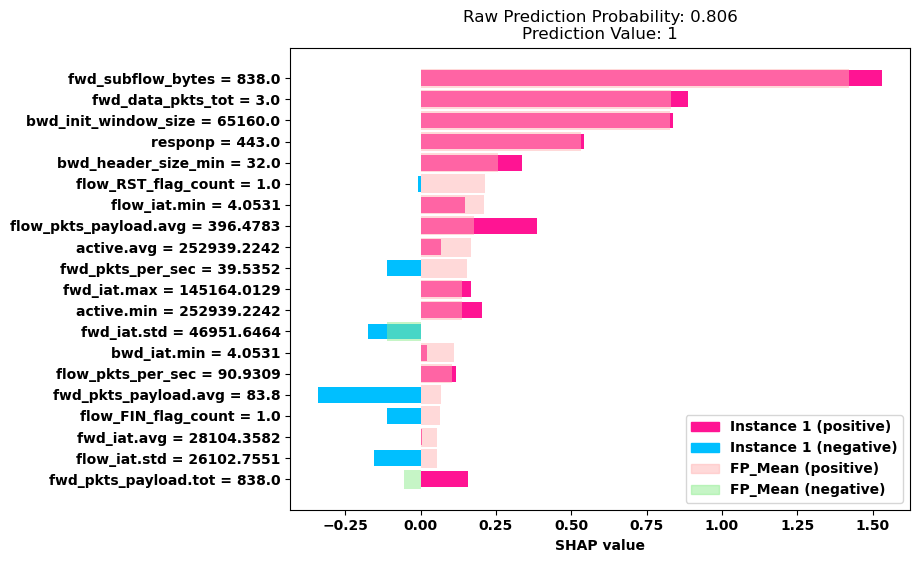

------------------------------------------------------------------------------------------------------------------------------------------------------


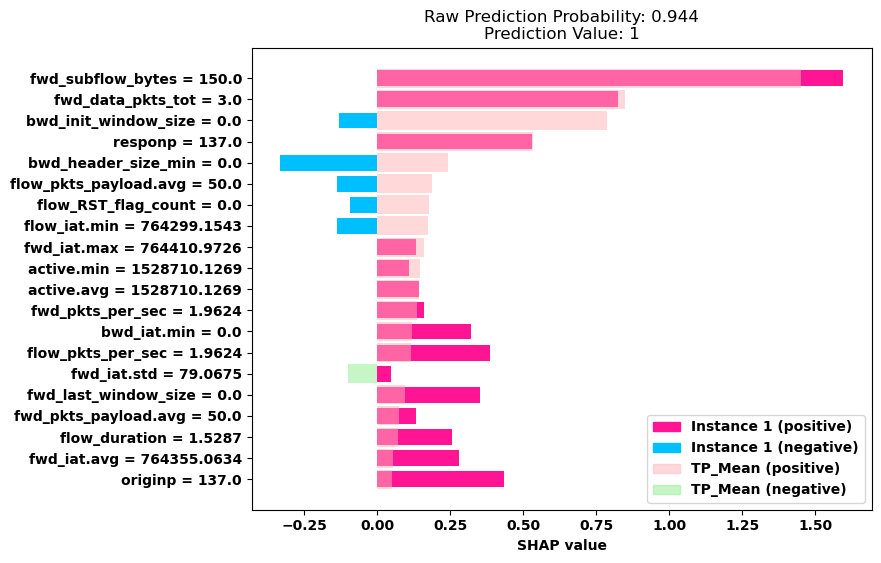

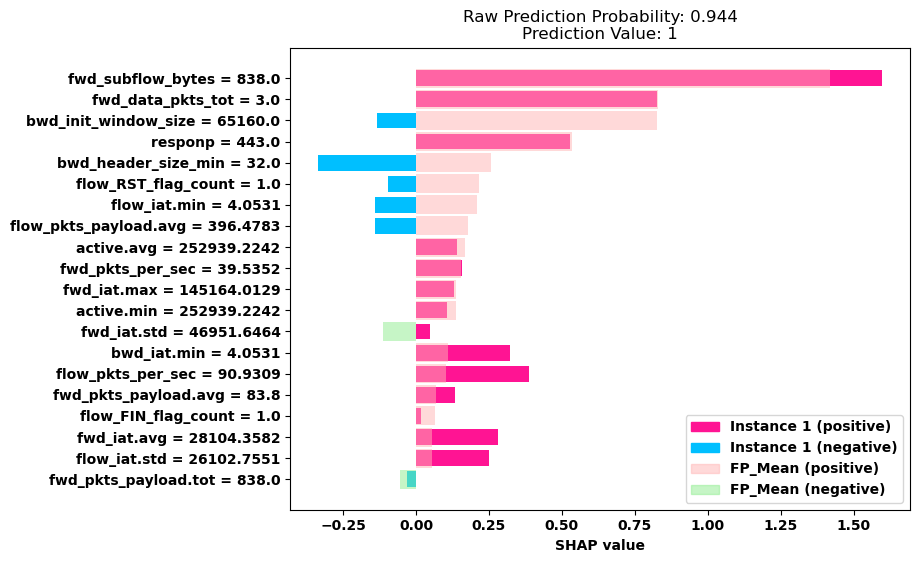

------------------------------------------------------------------------------------------------------------------------------------------------------


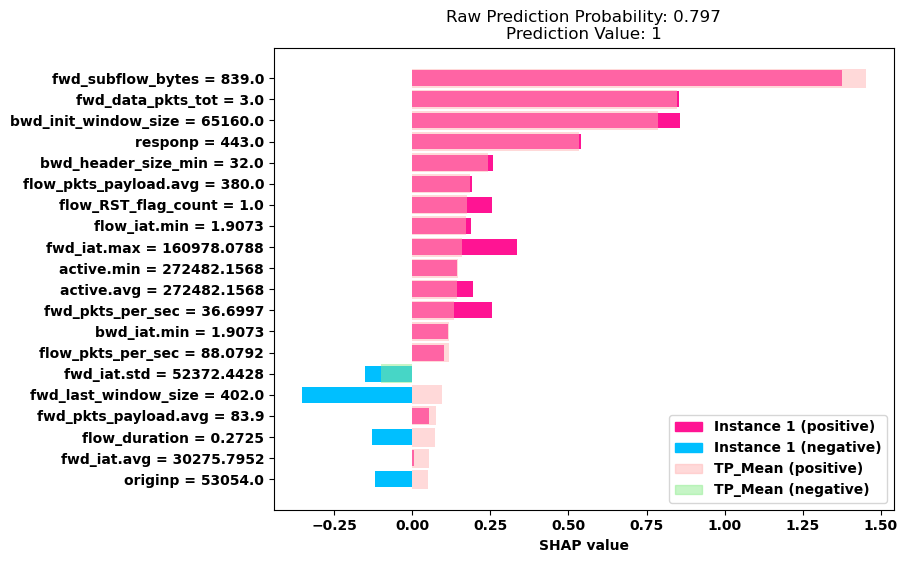

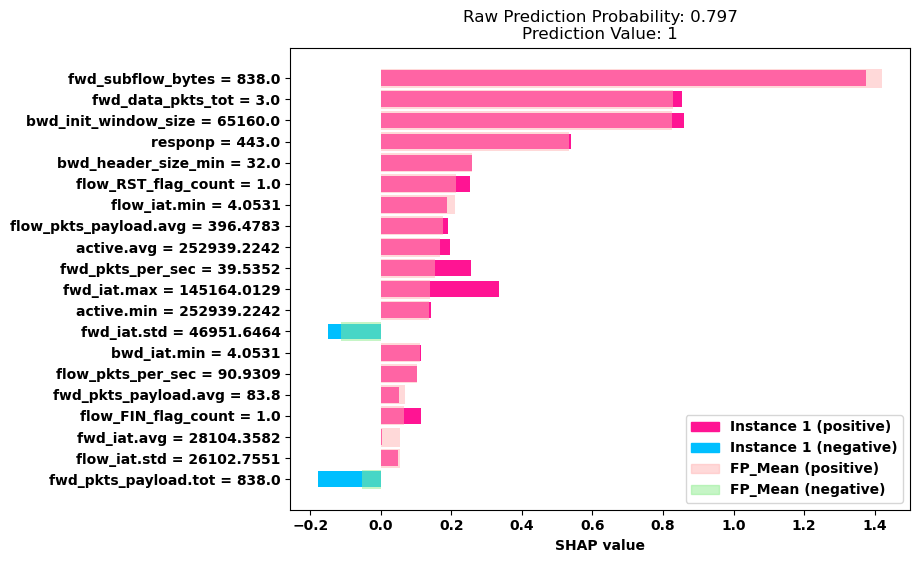

------------------------------------------------------------------------------------------------------------------------------------------------------


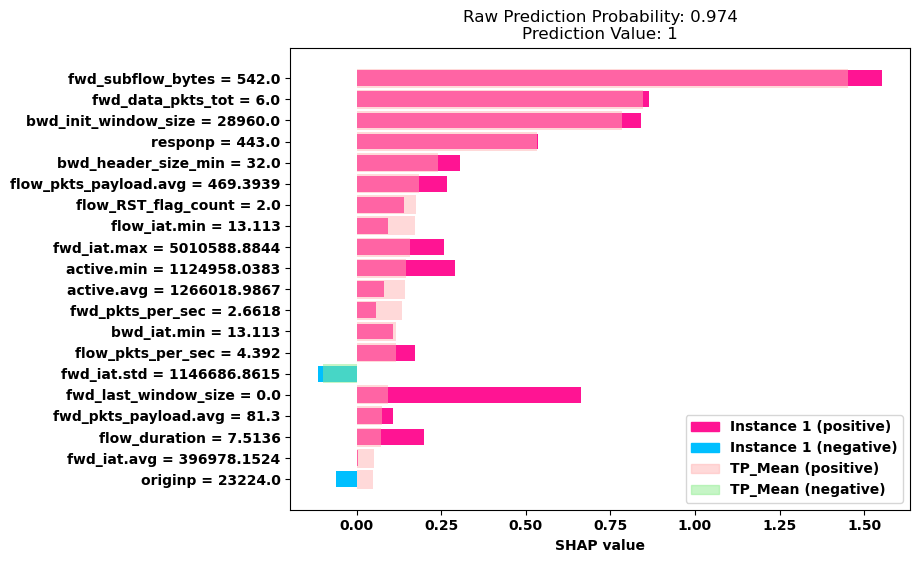

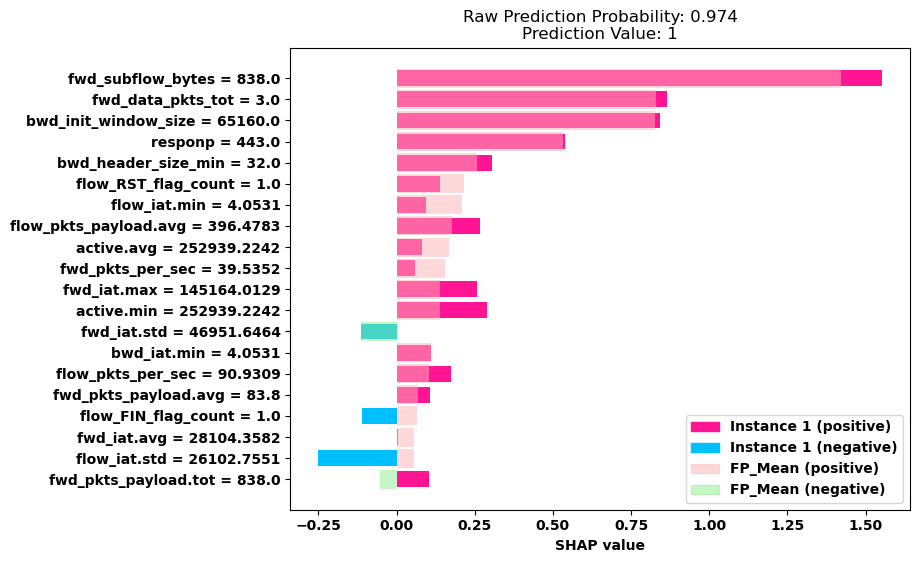

------------------------------------------------------------------------------------------------------------------------------------------------------


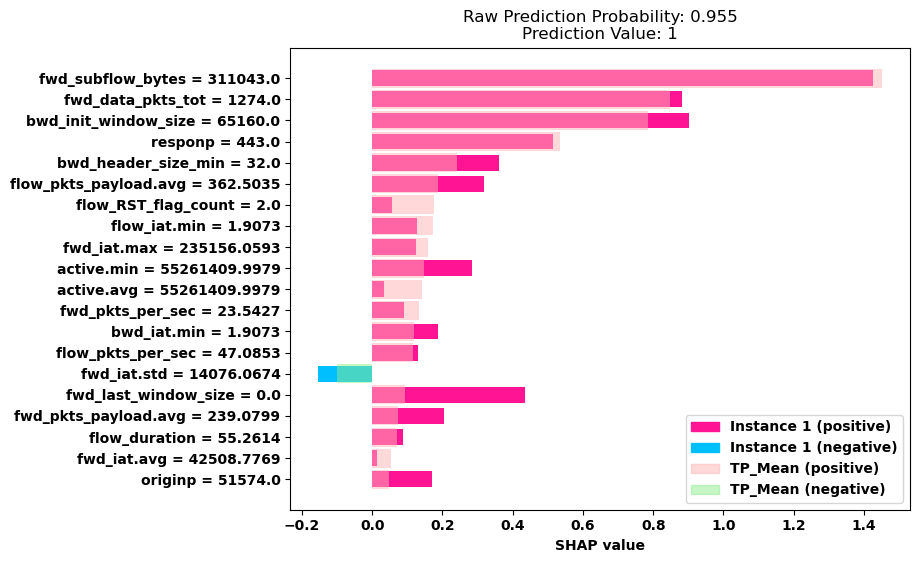

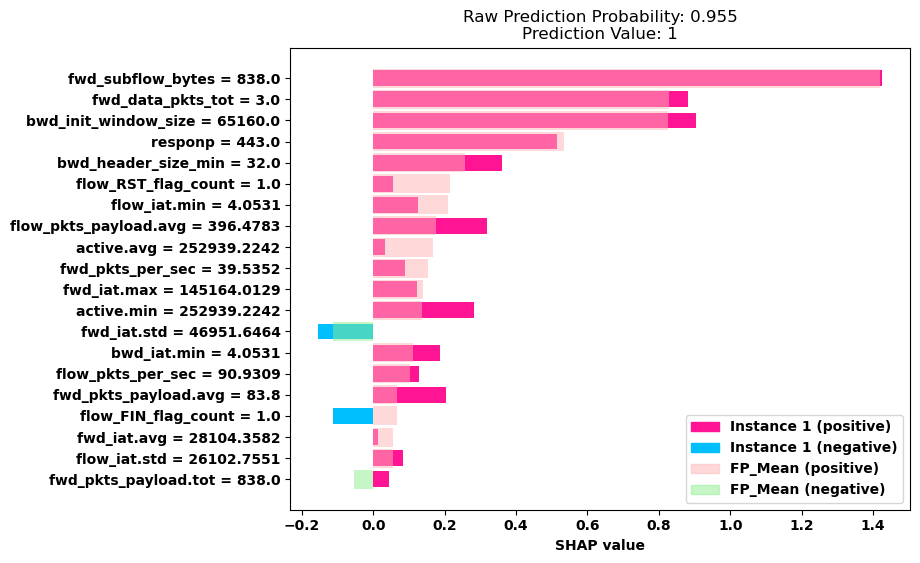

------------------------------------------------------------------------------------------------------------------------------------------------------


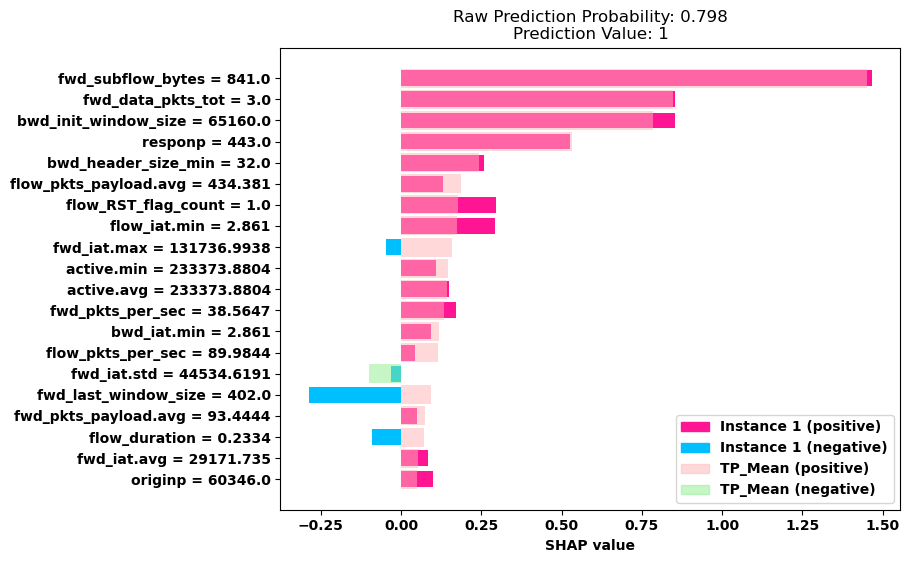

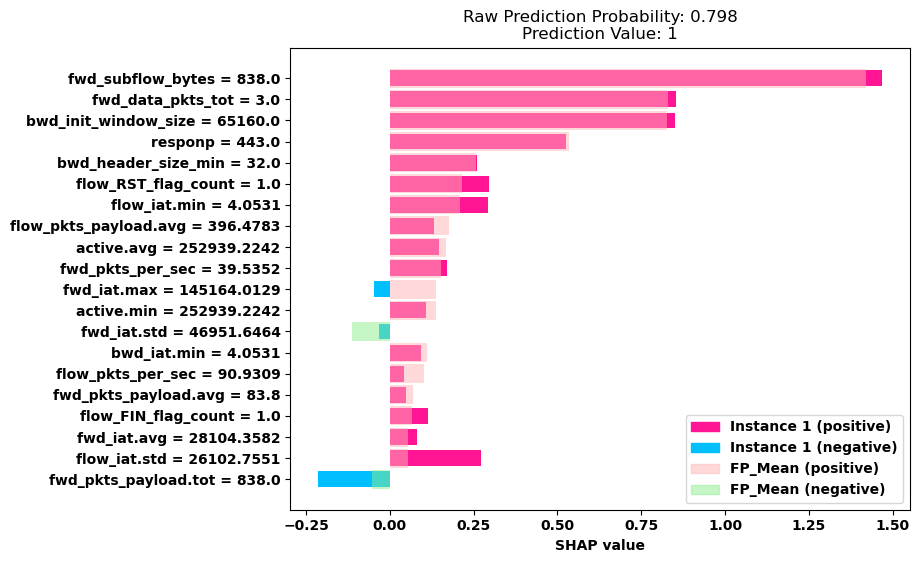

------------------------------------------------------------------------------------------------------------------------------------------------------


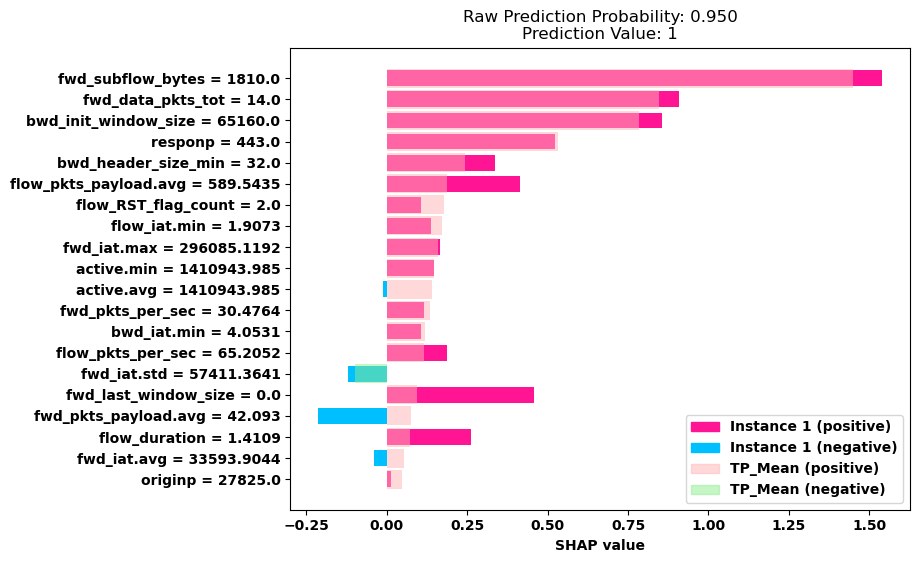

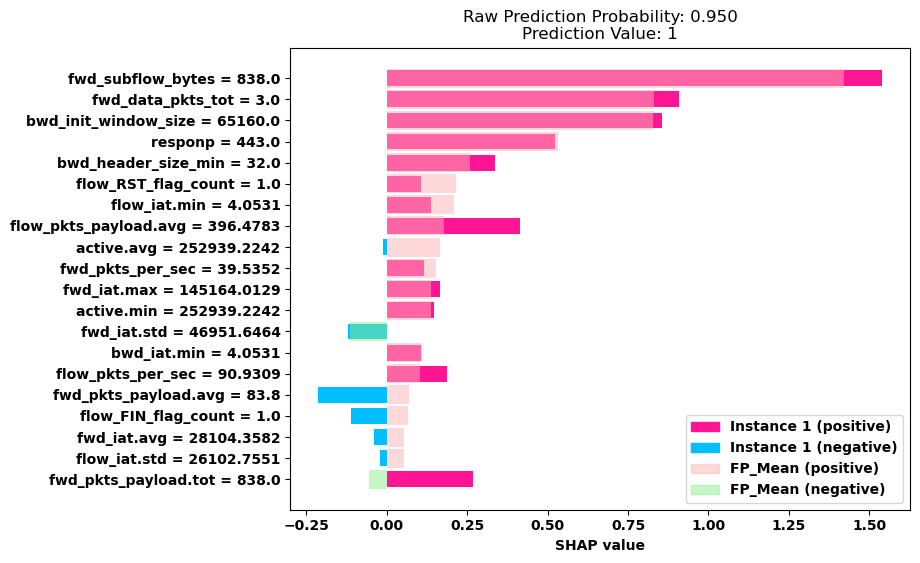

------------------------------------------------------------------------------------------------------------------------------------------------------


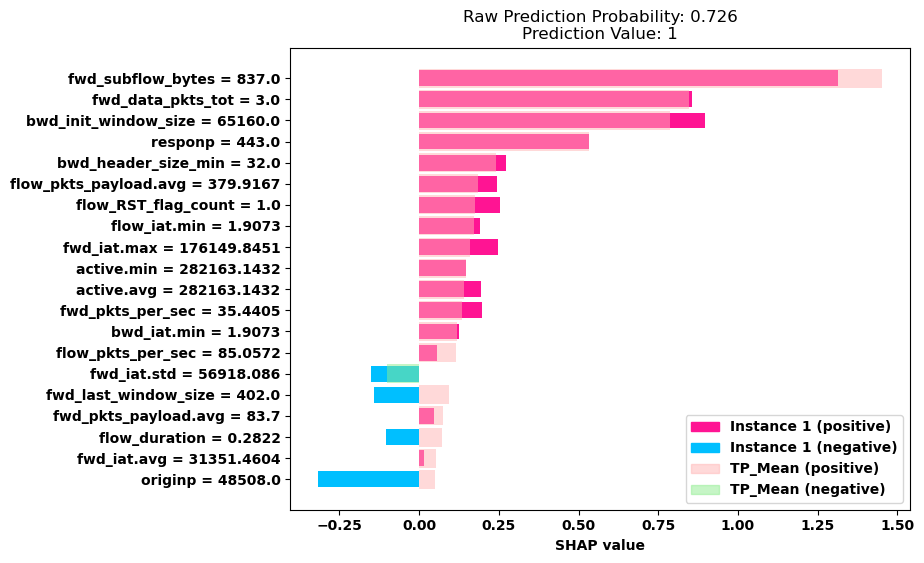

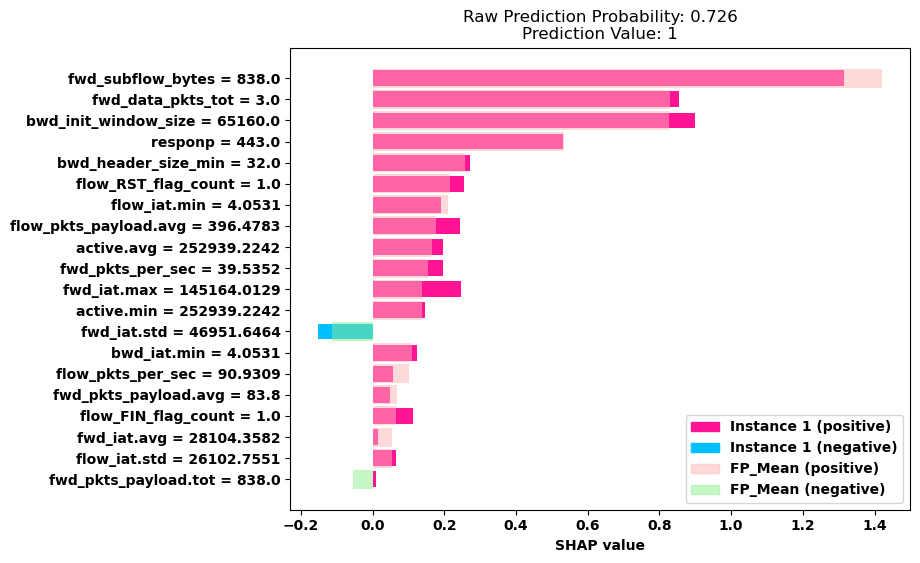

------------------------------------------------------------------------------------------------------------------------------------------------------


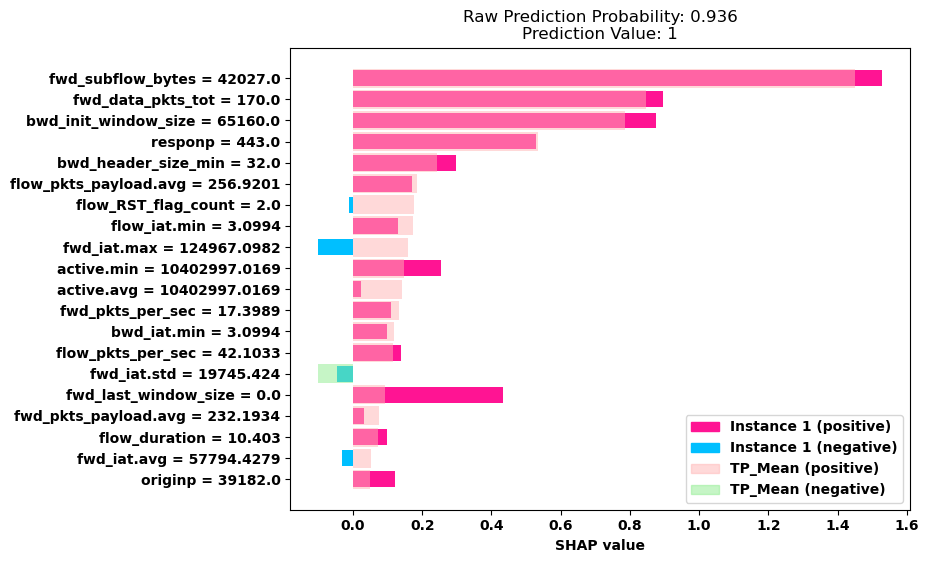

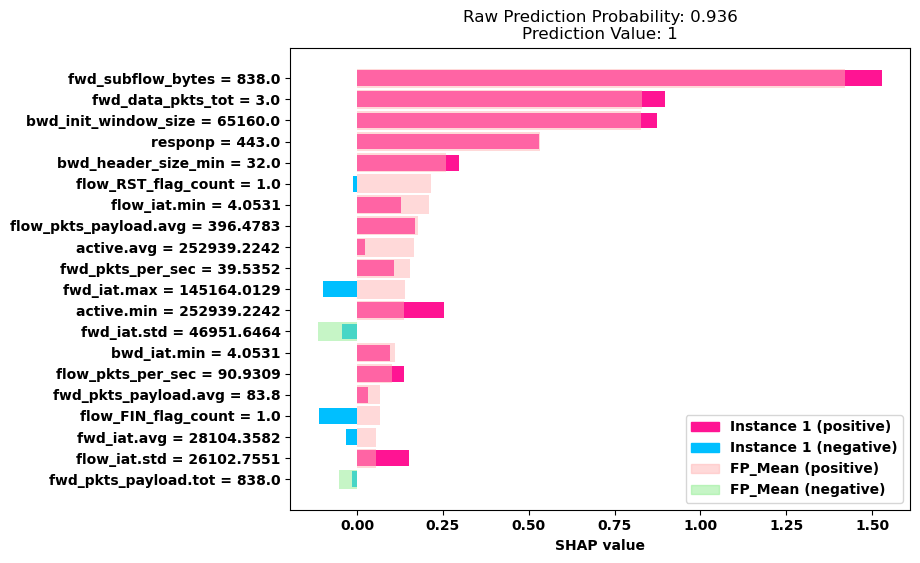

In [82]:
for i in range(10):
    print('-'*150)
    rand_idx = random.choice(tp_instances)
    tp_random_case = explainer(X_test[rand_idx])
    # print(np.abs(tp_random_case.values))
    plot_overlapping_shap(tp_random_case.values[tp_top_20_features], tp_shap_values_mean[tp_top_20_features], feature_names[tp_top_20_features], tp_random_case.data[tp_top_20_features], 'TP_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    # plot_overlapping_shap(tp_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'TN_Mean')
    plot_overlapping_shap(tp_random_case.values[fp_top_20_features], fp_shap_values_mean[fp_top_20_features], feature_names[fp_top_20_features], fp_random_case.data[fp_top_20_features], 'FP_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    # plot_overlapping_shap(tp_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], fn_random_case.data[fn_top_20_features], 'FN_Mean')
    plt.rcParams["figure.figsize"] = (8,6)
    plt.yticks(rotation=0)
    plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
    plt.show()

------------------------------------------------------------------------------------------------------------------------------------------------------


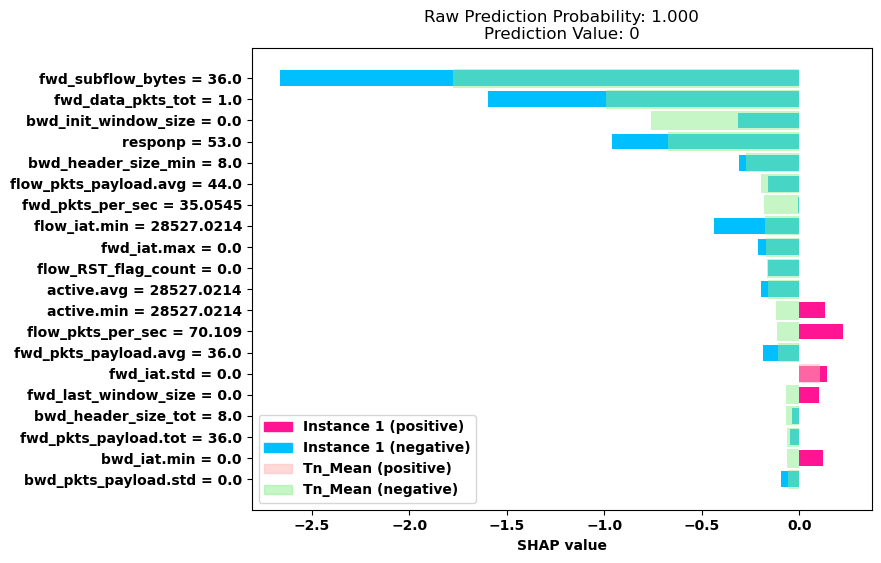

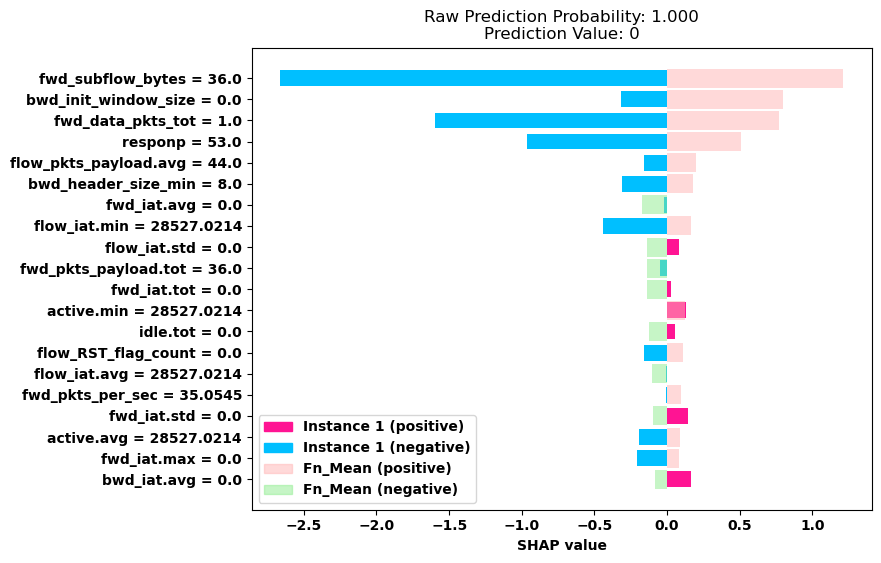

------------------------------------------------------------------------------------------------------------------------------------------------------


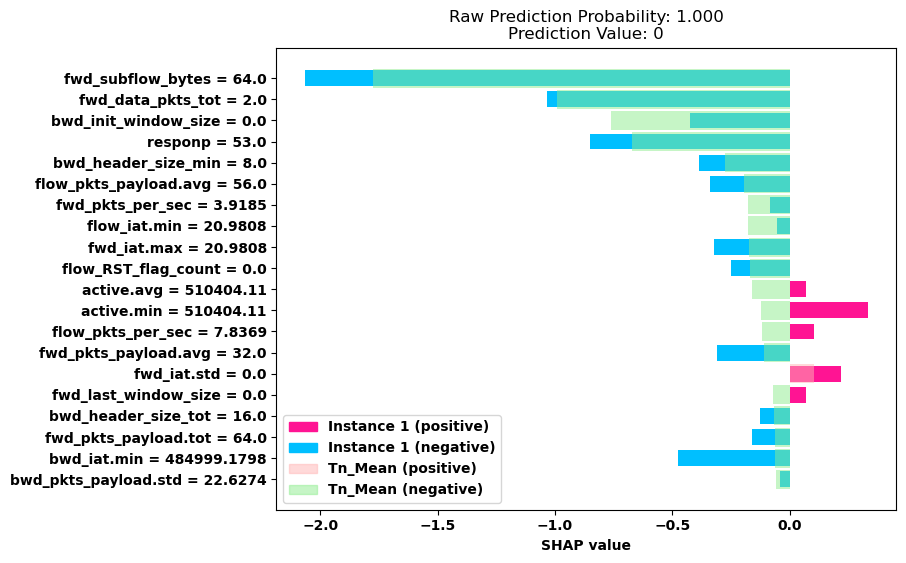

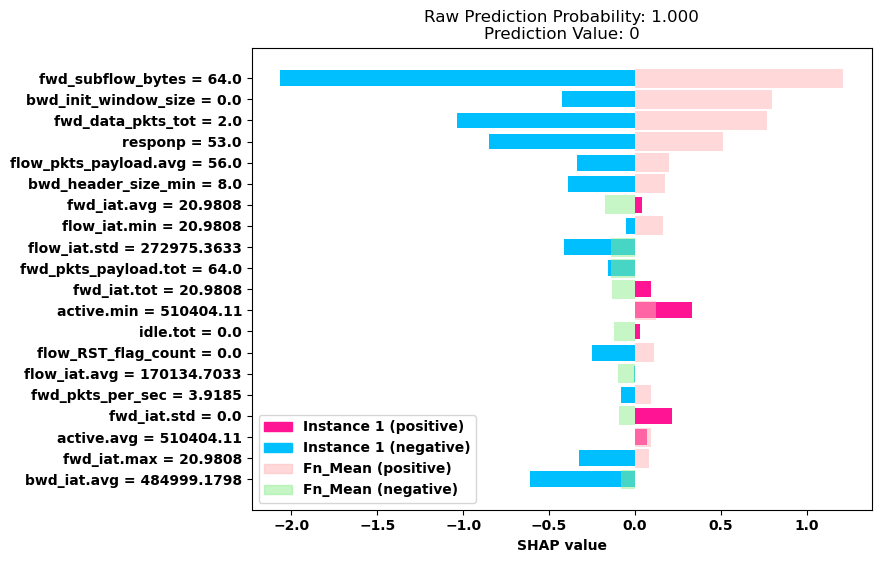

------------------------------------------------------------------------------------------------------------------------------------------------------


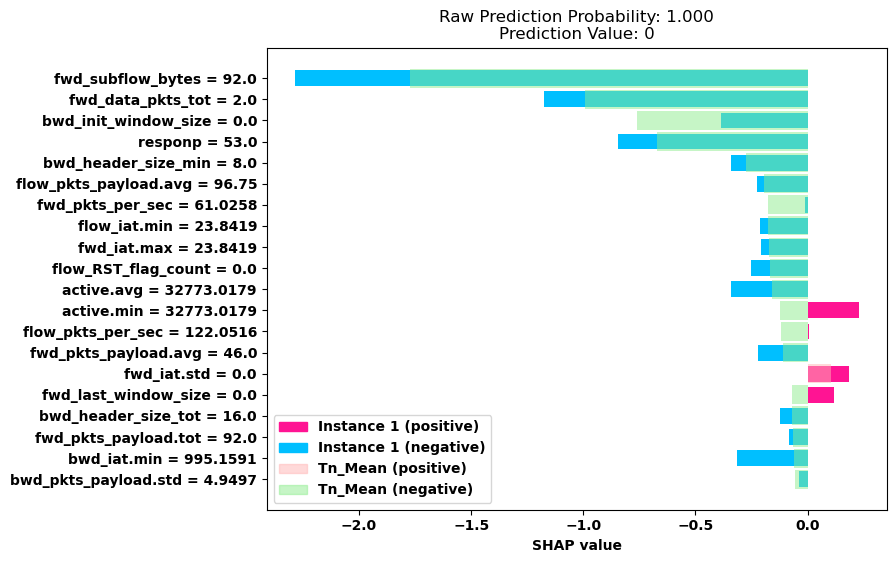

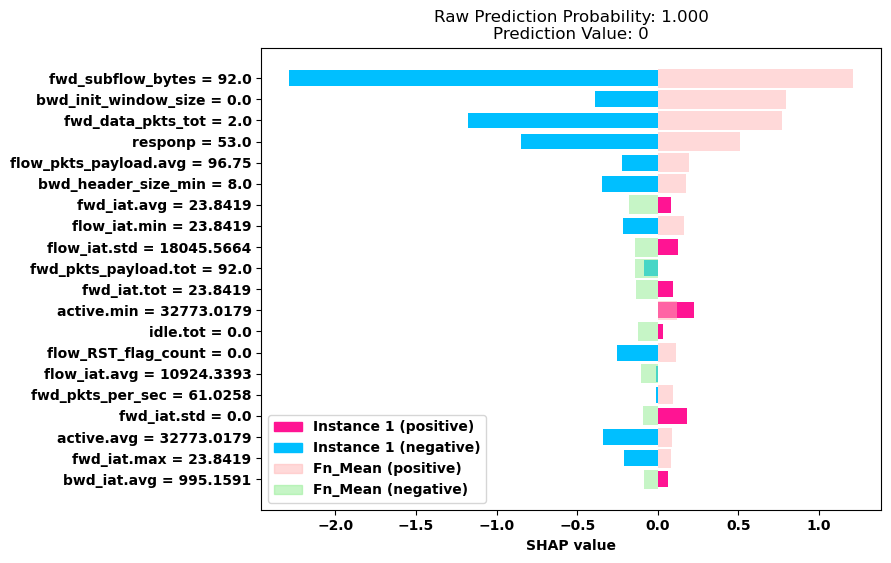

------------------------------------------------------------------------------------------------------------------------------------------------------


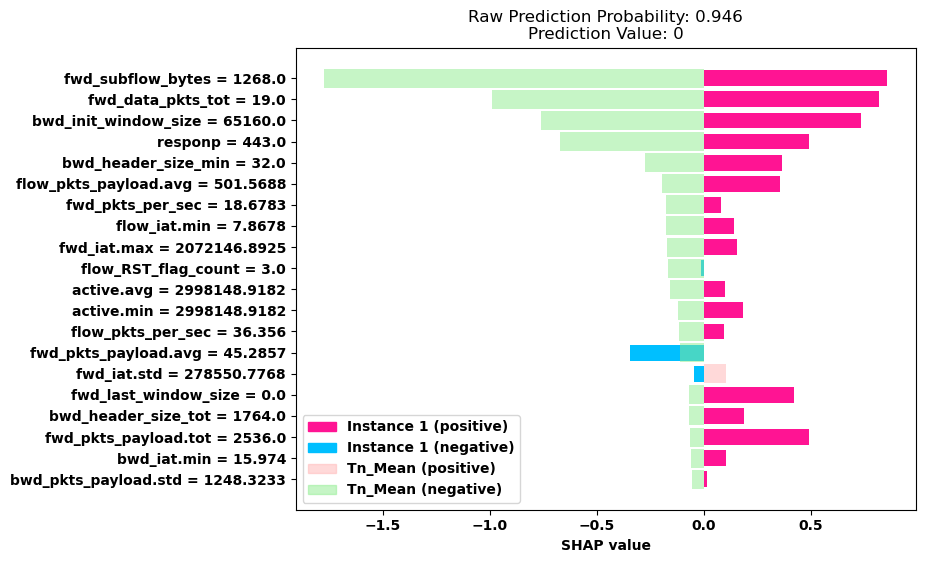

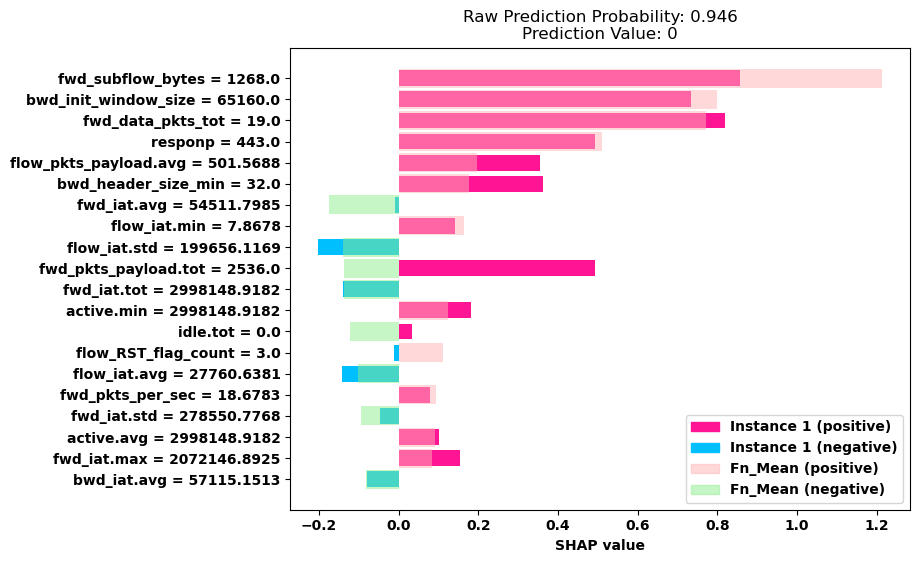

------------------------------------------------------------------------------------------------------------------------------------------------------


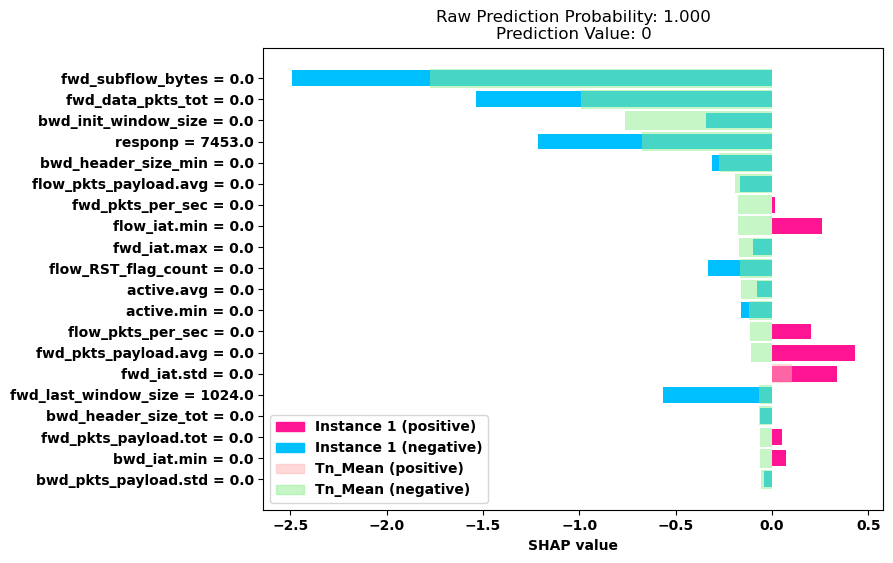

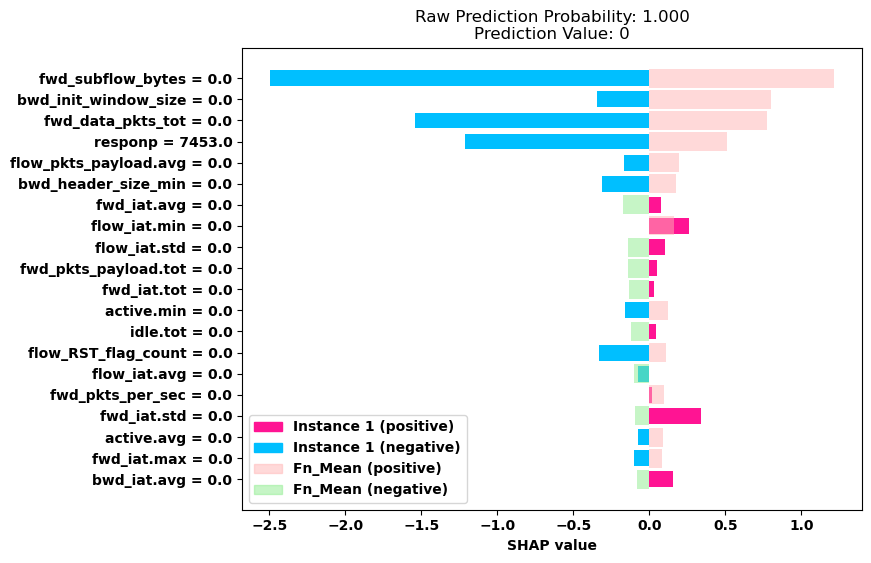

------------------------------------------------------------------------------------------------------------------------------------------------------


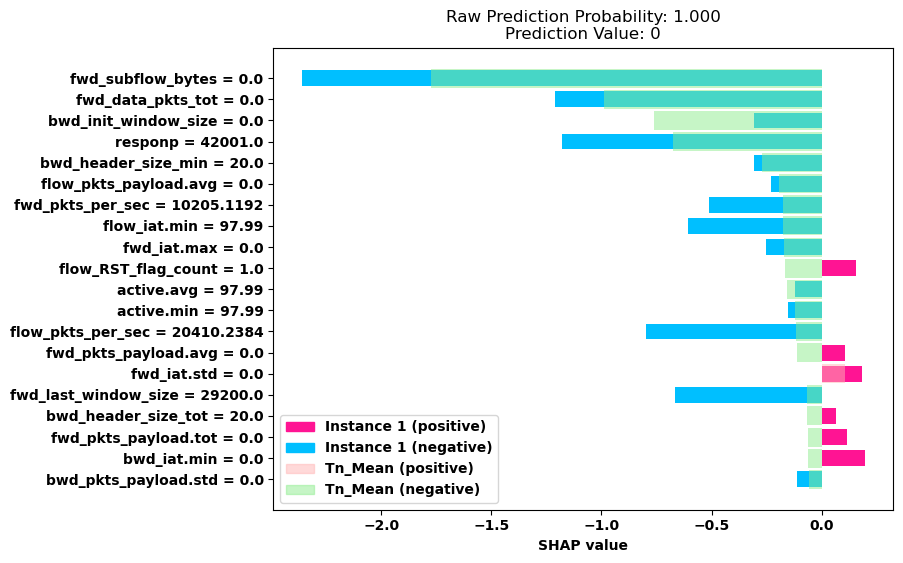

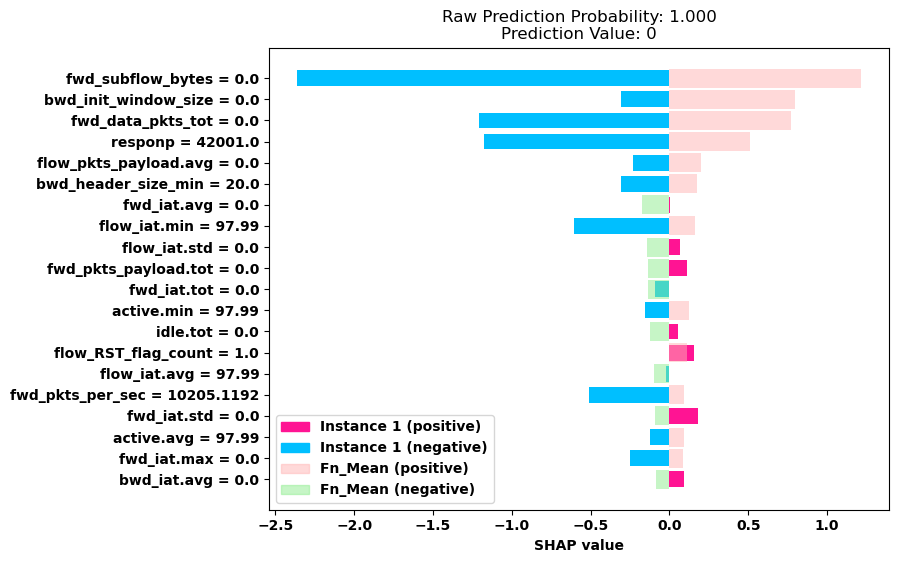

------------------------------------------------------------------------------------------------------------------------------------------------------


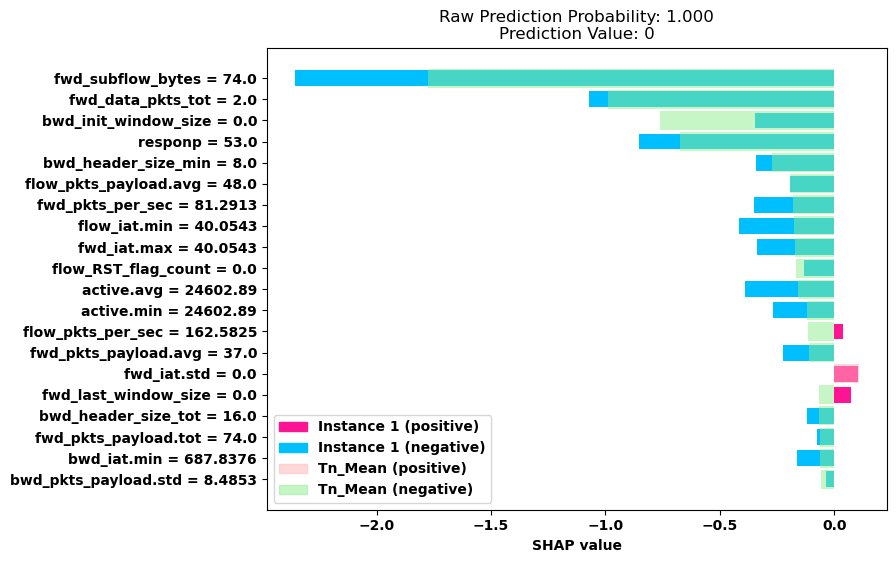

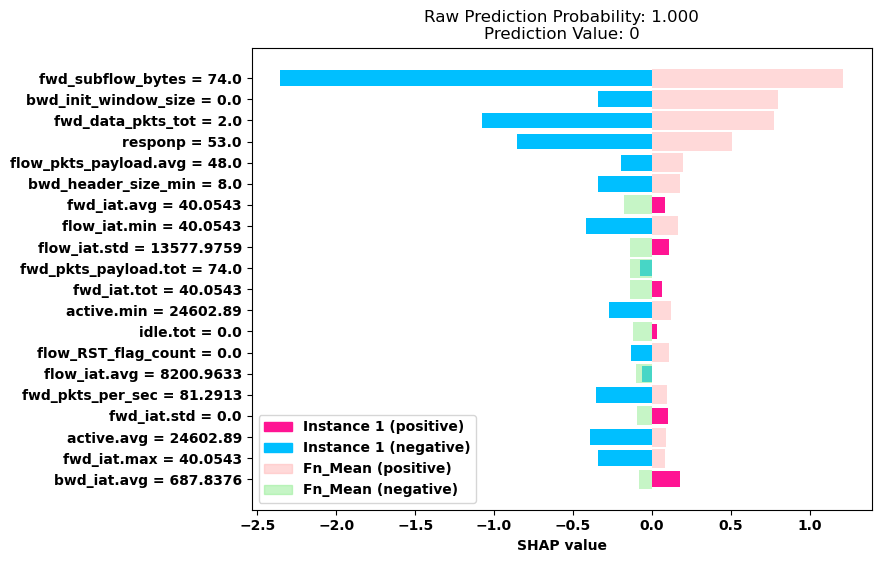

------------------------------------------------------------------------------------------------------------------------------------------------------


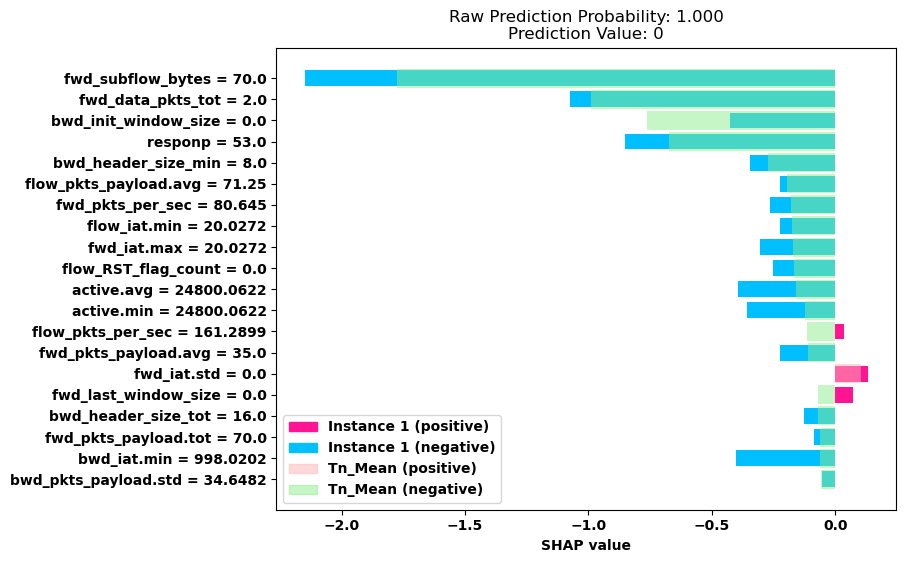

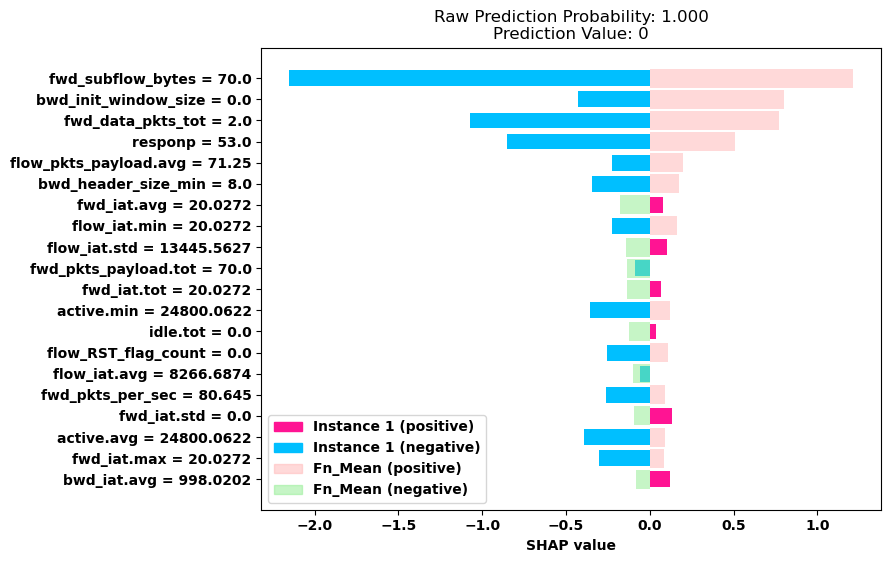

------------------------------------------------------------------------------------------------------------------------------------------------------


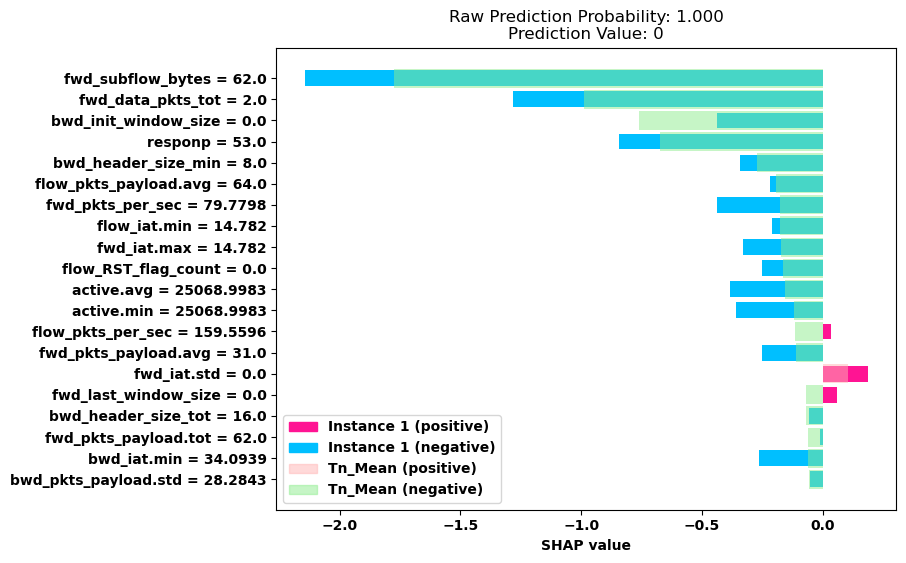

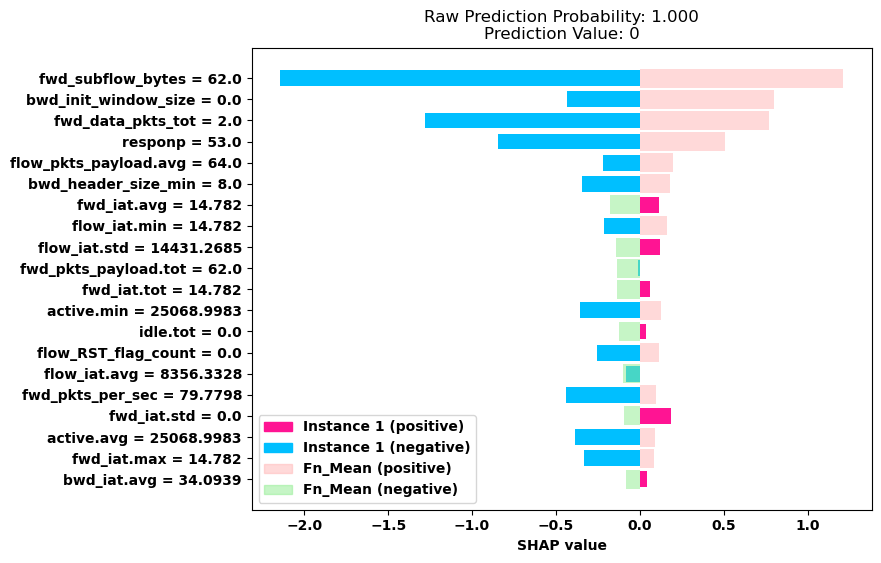

------------------------------------------------------------------------------------------------------------------------------------------------------


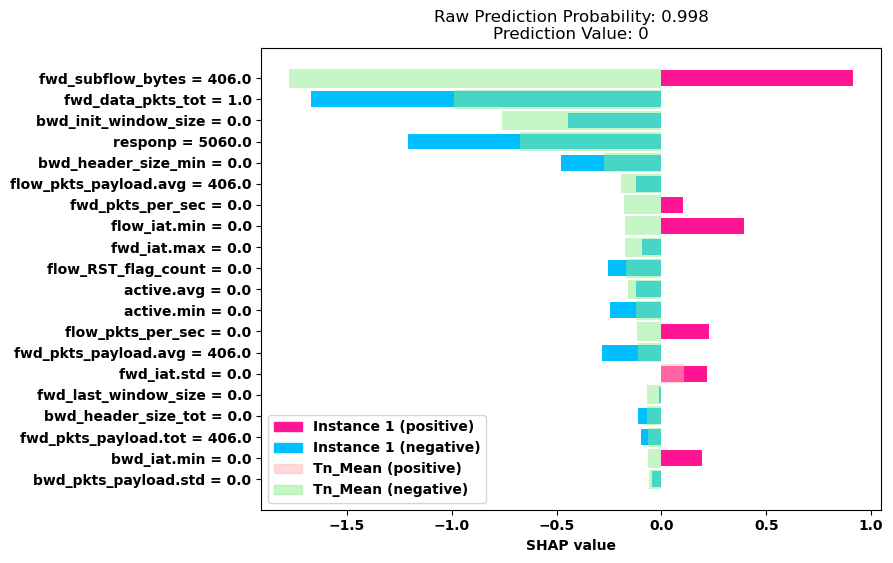

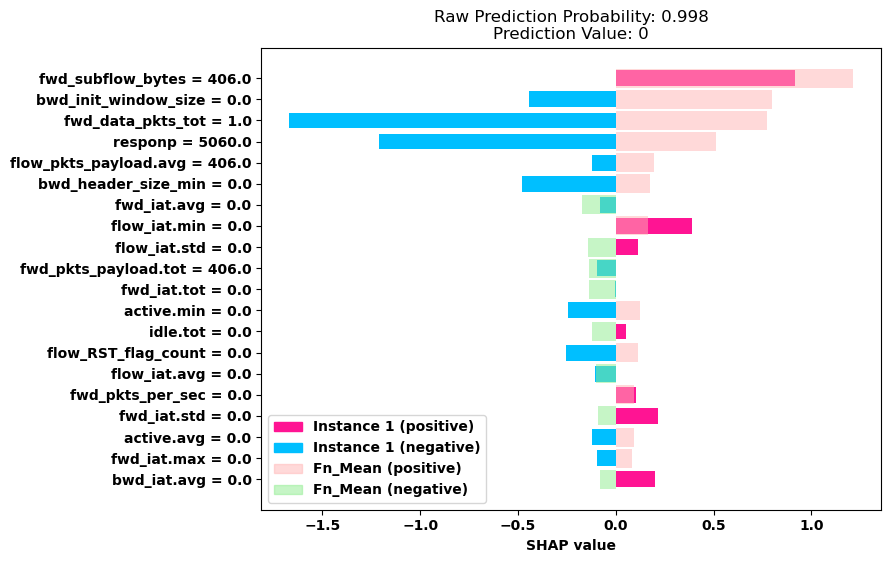

In [83]:
# tn_random_case = tn_shap_values[random.randrange(tp_tn_random_size-1)]
# # print(np.abs(tn_random_case.values))
# plot_overlapping_shap(tn_random_case.values[tp_top_20_features], tp_shap_values_mean[tp_top_20_features], feature_names[tp_top_20_features], tn_random_case.data[tp_top_20_features], 'TP_Mean')
# plot_overlapping_shap(tn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'TN_Mean')
# plot_overlapping_shap(tn_random_case.values[fp_top_20_features], fp_shap_values_mean[fp_top_20_features], feature_names[fp_top_20_features], fp_random_case.data[fp_top_20_features], 'FP_Mean')
# plot_overlapping_shap(tn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], tn_random_case.data[fn_top_20_features], 'FN_Mean')
# plt.rcParams["figure.figsize"] = (8,6)
# plt.yticks(rotation=0)
# plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
# plt.show()


for i in range(10):
    print('-'*150)
    rand_idx = random.choice(tn_instances)
    tn_random_case = explainer(X_test[rand_idx])
    # print(np.abs(tn_random_case.values))
    plot_overlapping_shap(tn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'Tn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    # plot_overlapping_shap(tn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'TN_Mean')
    plot_overlapping_shap(tn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], tn_random_case.data[fn_top_20_features], 'Fn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    # plot_overlapping_shap(tn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], tn_random_case.data[fn_top_20_features], 'FN_Mean')
    plt.rcParams["figure.figsize"] = (8,6)
    plt.yticks(rotation=0)
    plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
    plt.show()

------------------------------------------------------------------------------------------------------------------------------------------------------


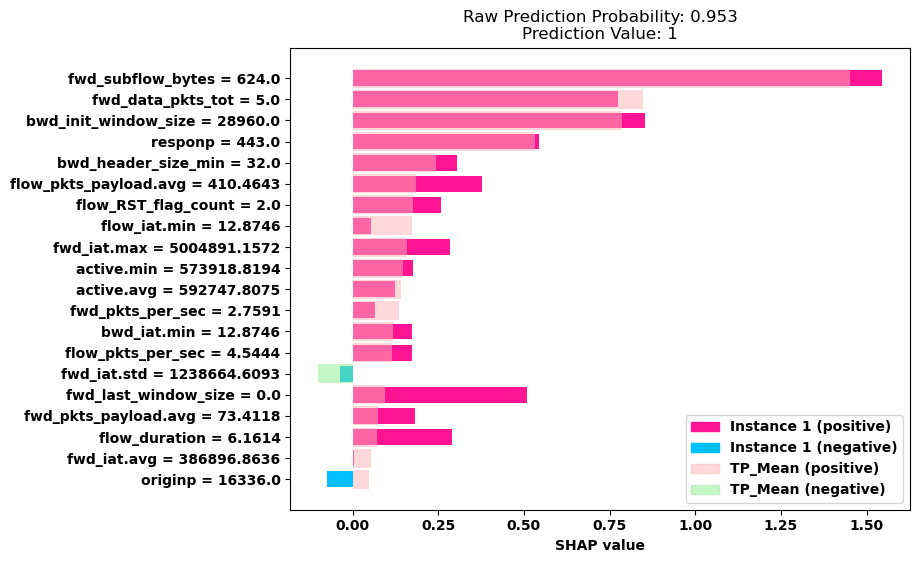

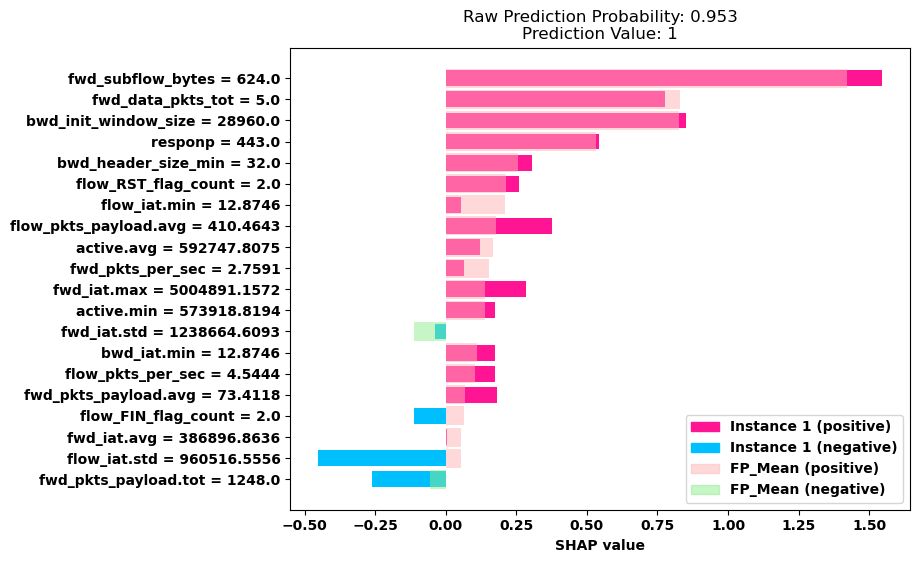

------------------------------------------------------------------------------------------------------------------------------------------------------


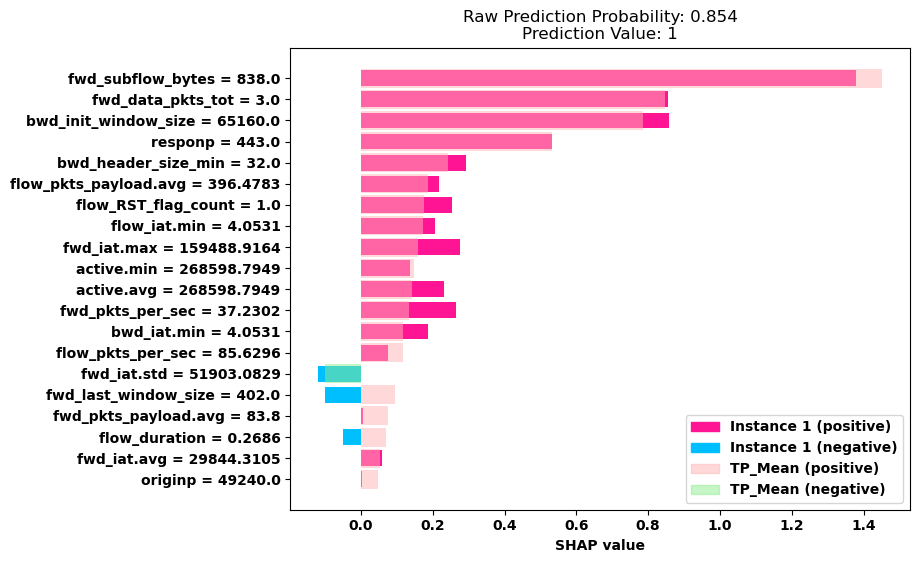

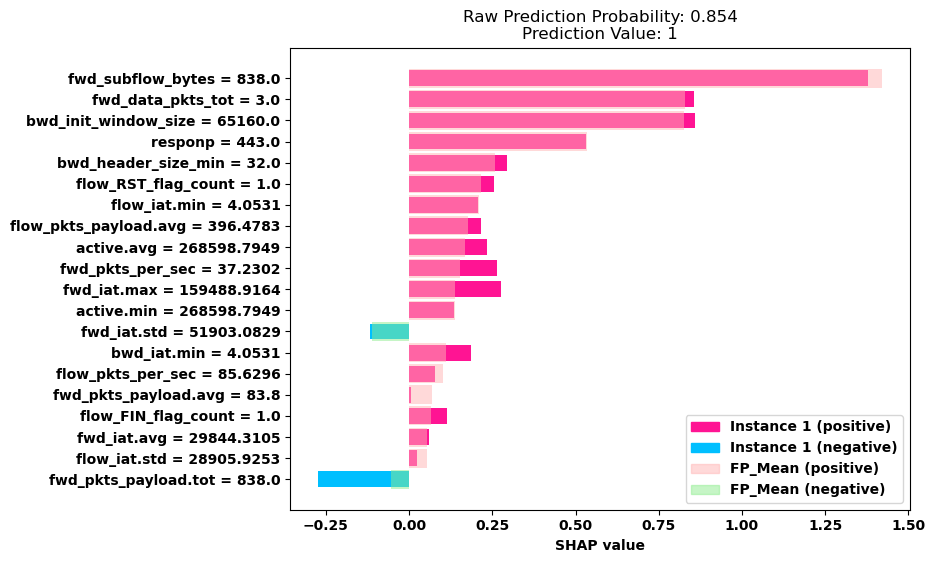

------------------------------------------------------------------------------------------------------------------------------------------------------


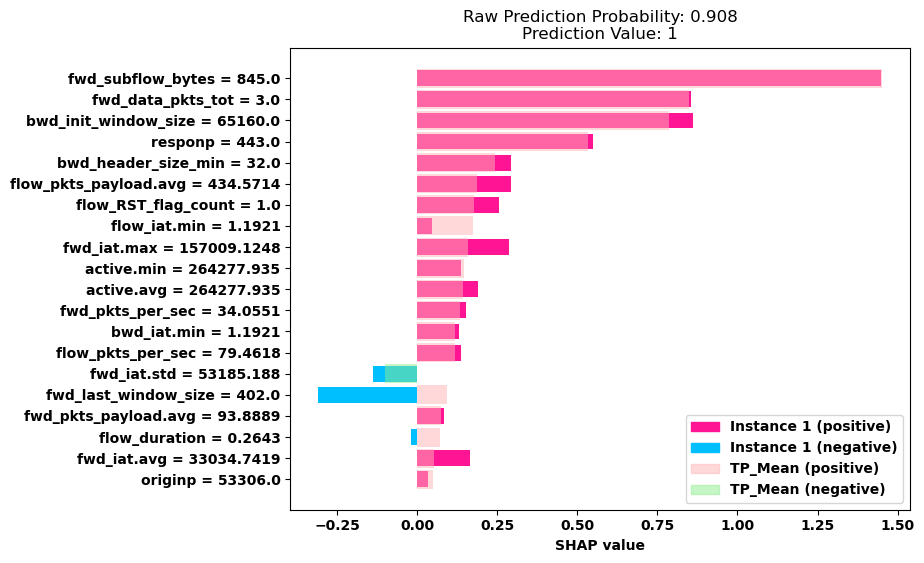

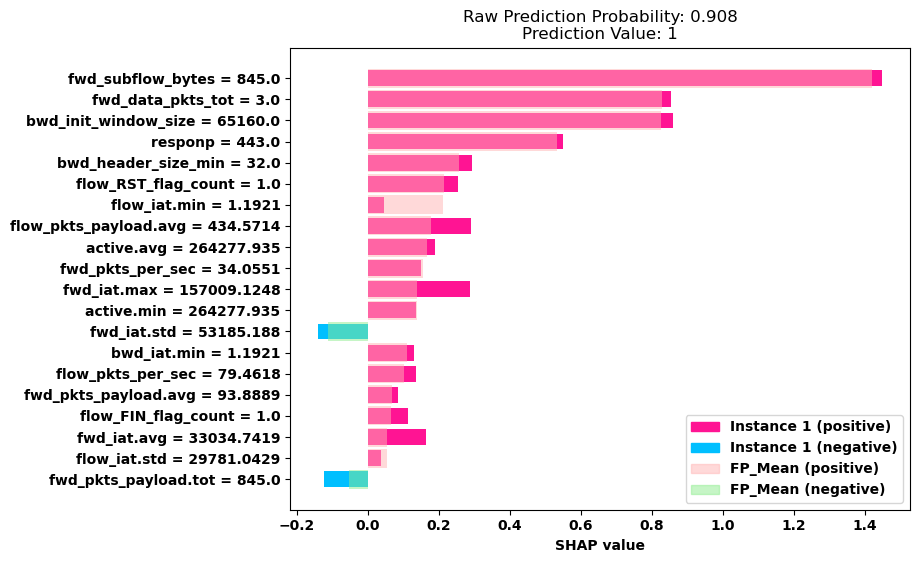

------------------------------------------------------------------------------------------------------------------------------------------------------


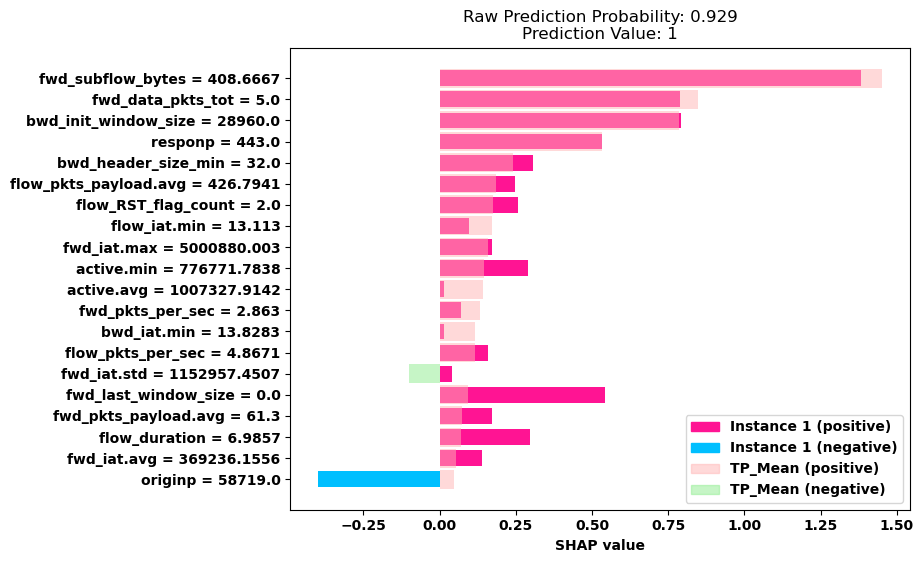

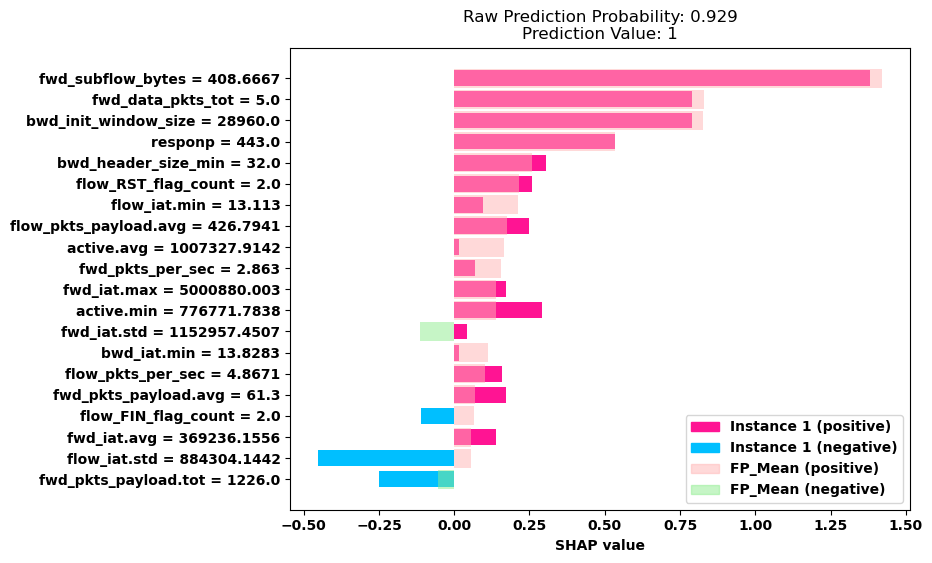

------------------------------------------------------------------------------------------------------------------------------------------------------


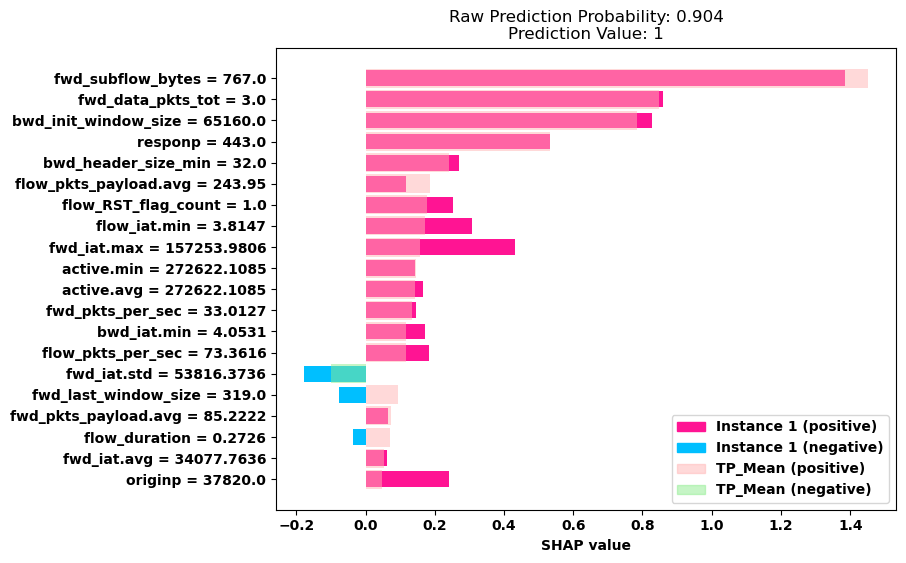

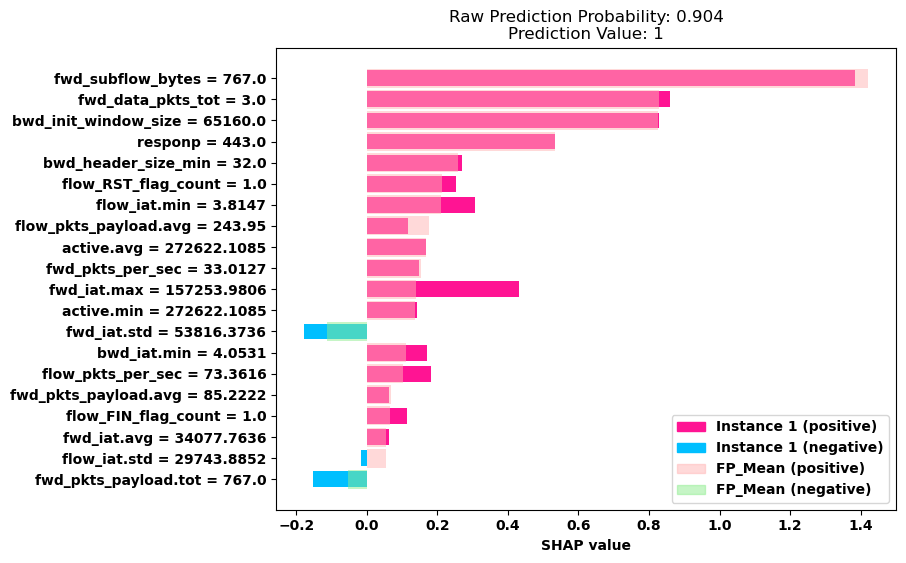

------------------------------------------------------------------------------------------------------------------------------------------------------


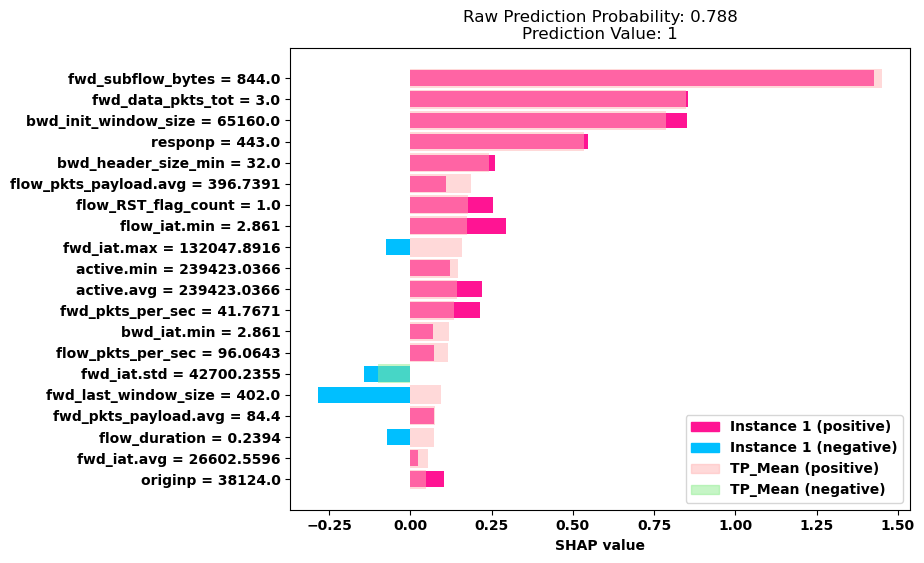

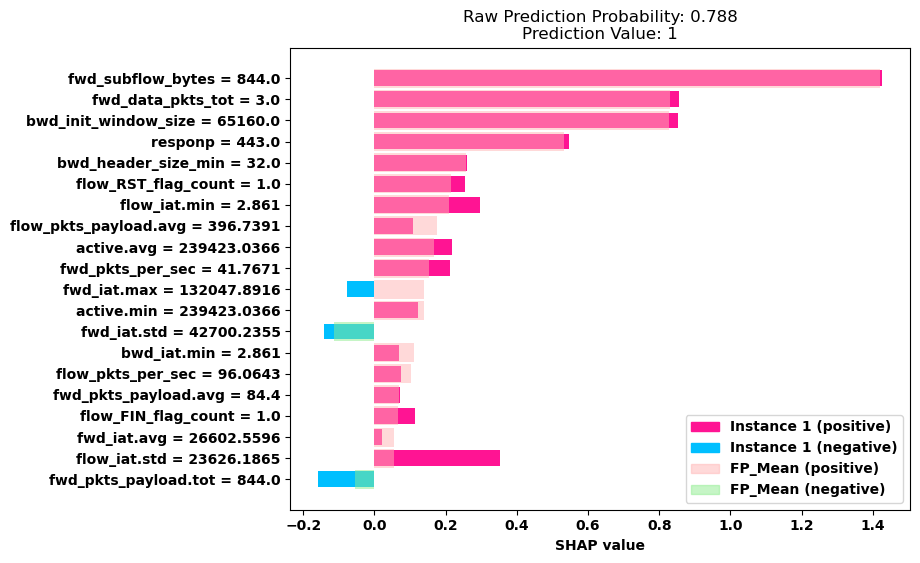

------------------------------------------------------------------------------------------------------------------------------------------------------


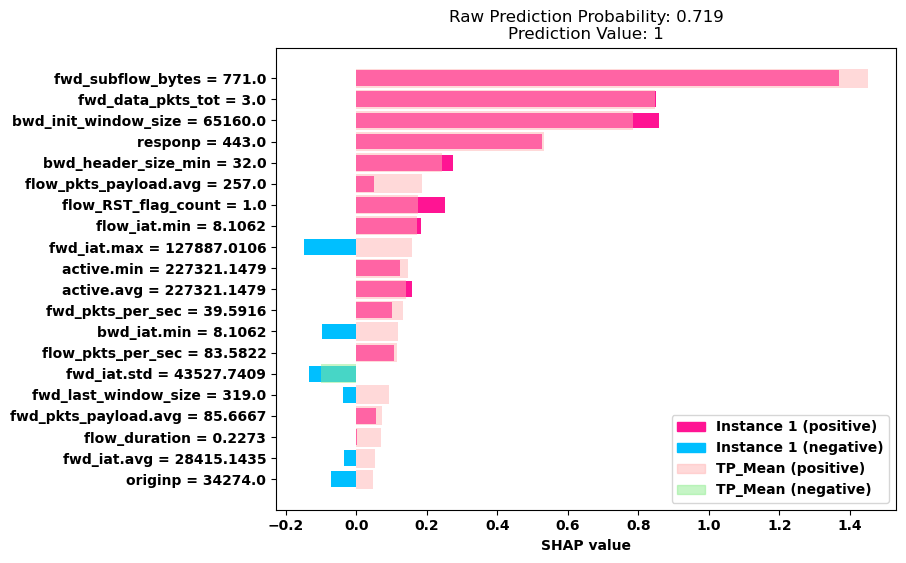

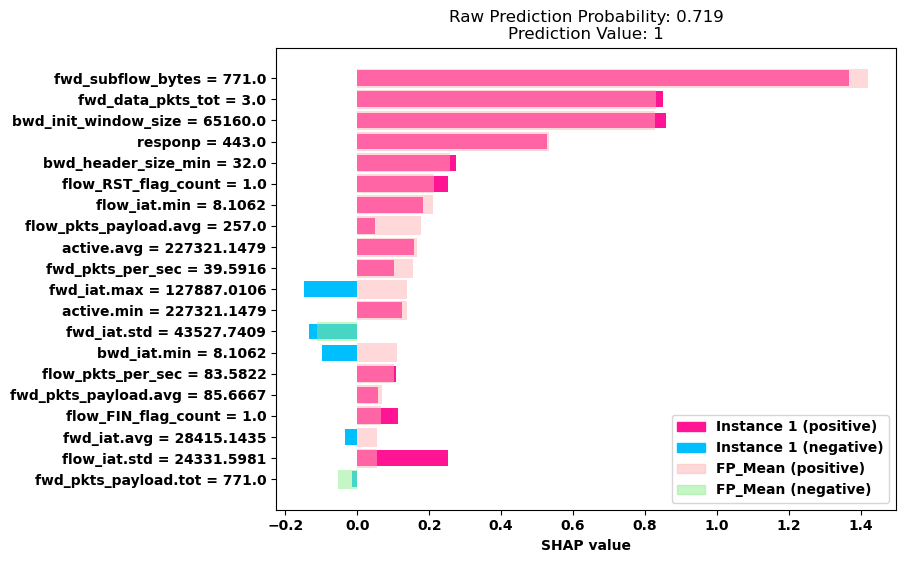

------------------------------------------------------------------------------------------------------------------------------------------------------


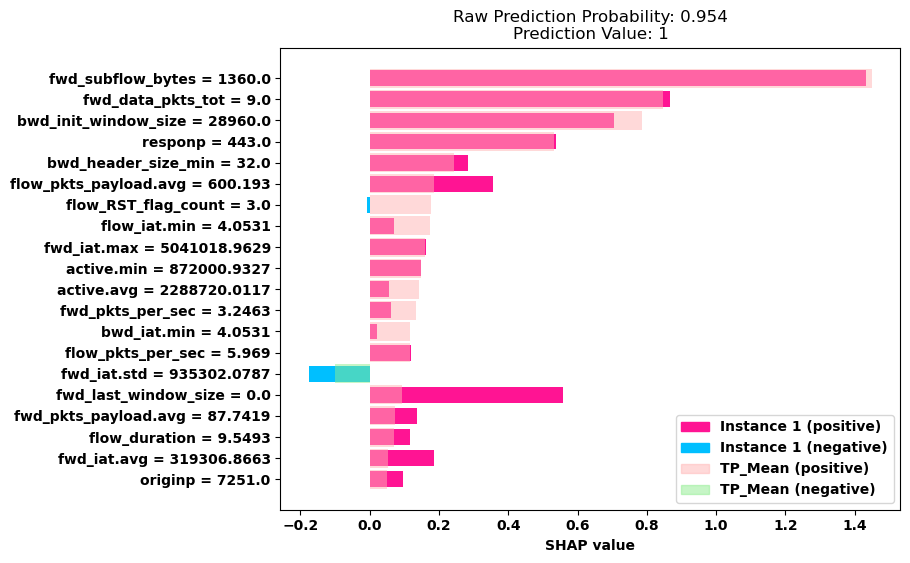

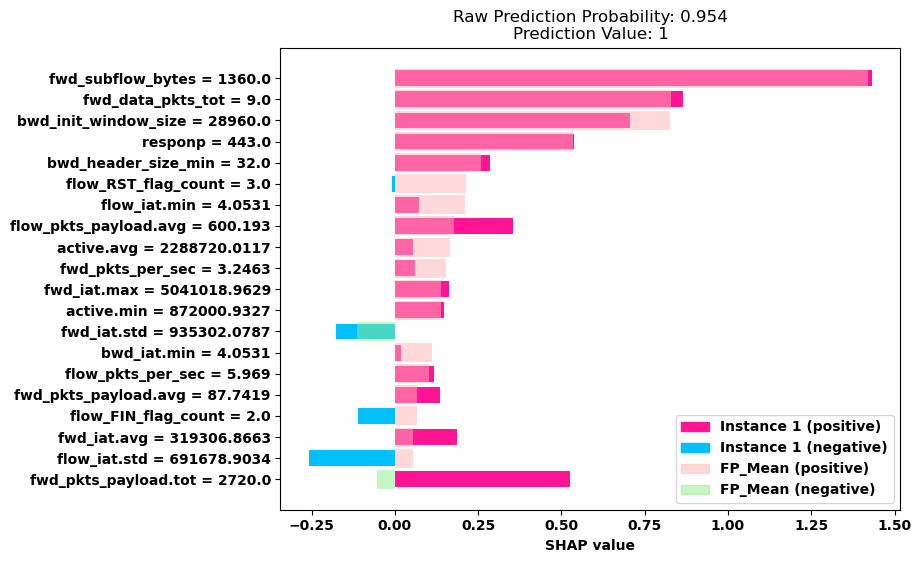

------------------------------------------------------------------------------------------------------------------------------------------------------


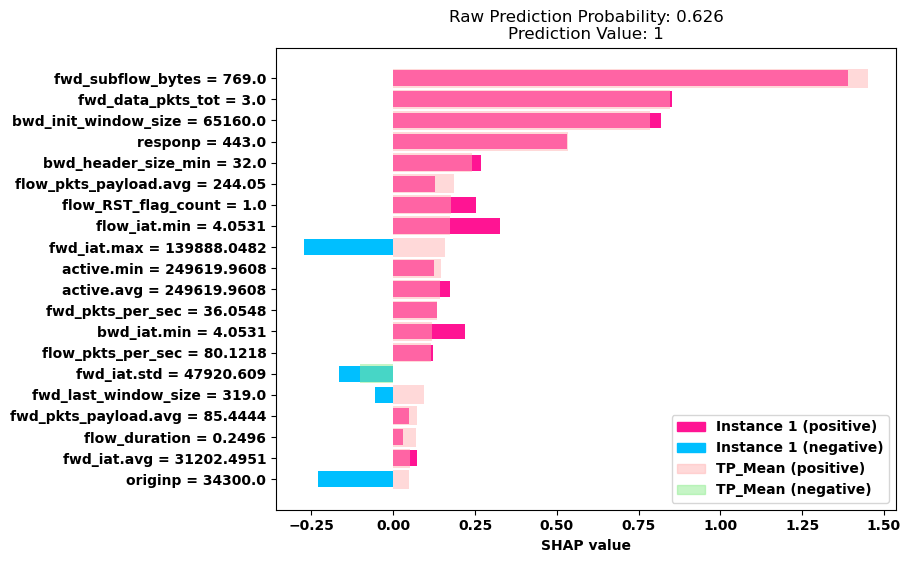

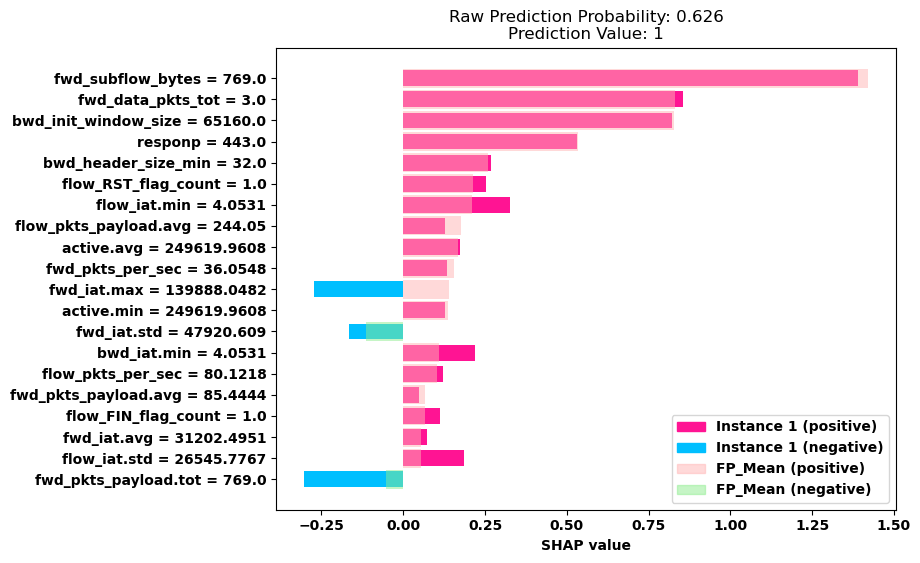

------------------------------------------------------------------------------------------------------------------------------------------------------


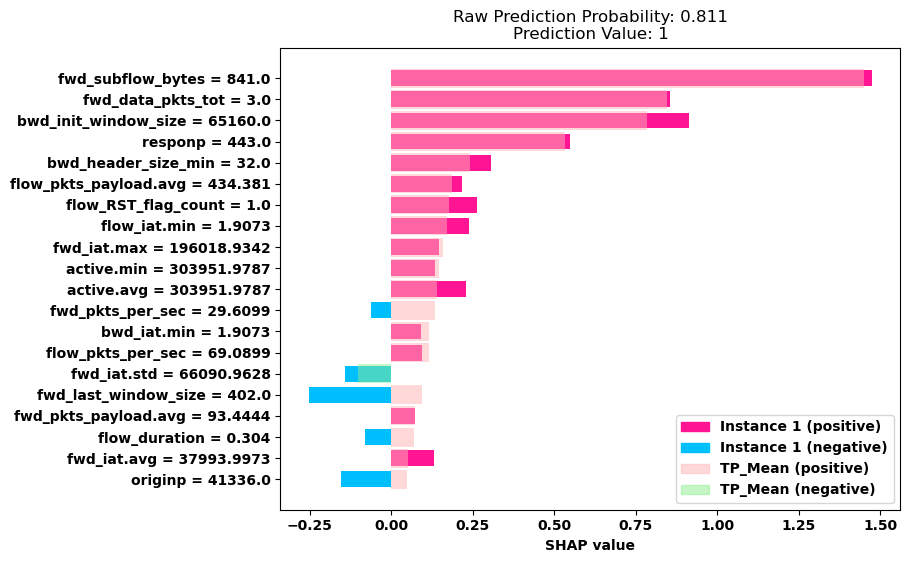

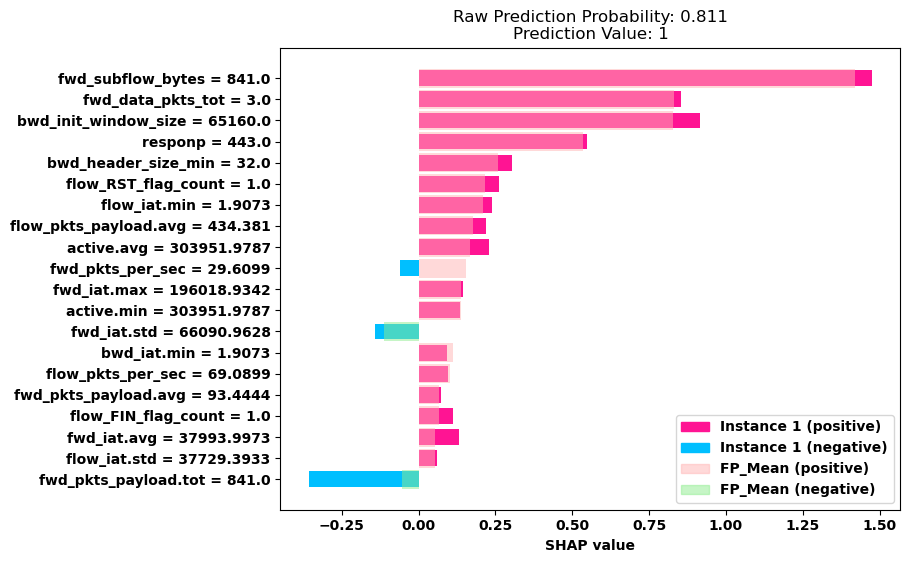

In [84]:
for i in range(10):
    print('-'*150)
    rand_idx = random.choice(fp_instances)
    fp_random_case = explainer(X_test[rand_idx])
    # print(np.abs(fp_random_case.values))
    plot_overlapping_shap(fp_random_case.values[tp_top_20_features], tp_shap_values_mean[tp_top_20_features], feature_names[tp_top_20_features], fp_random_case.data[tp_top_20_features], 'TP_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    # plot_overlapping_shap(fp_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'TN_Mean')
    plot_overlapping_shap(fp_random_case.values[fp_top_20_features], fp_shap_values_mean[fp_top_20_features], feature_names[fp_top_20_features], fp_random_case.data[fp_top_20_features], 'FP_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    # plot_overlapping_shap(fp_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], fn_random_case.data[fn_top_20_features], 'FN_Mean')
    plt.rcParams["figure.figsize"] = (8,6)
    plt.yticks(rotation=0)
    plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
    plt.show()

------------------------------------------------------------------------------------------------------------------------------------------------------


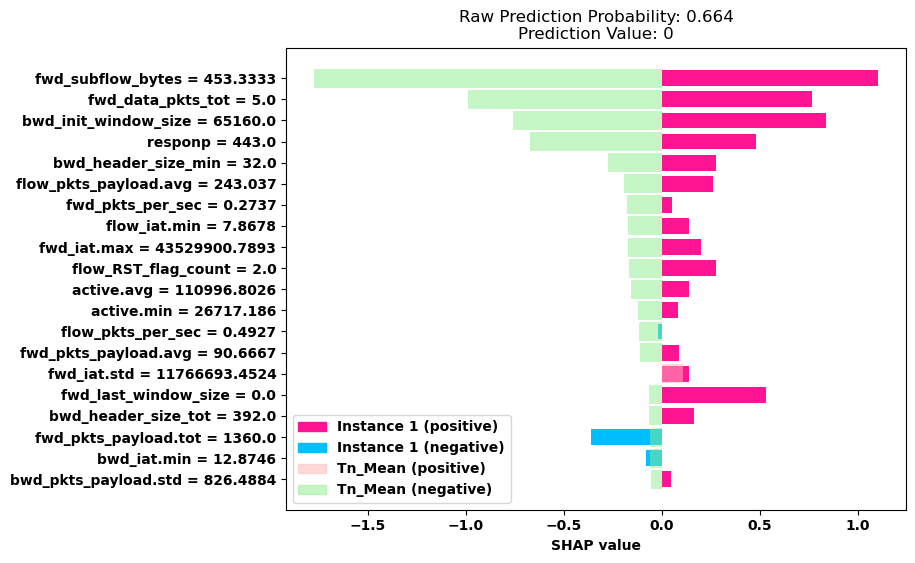

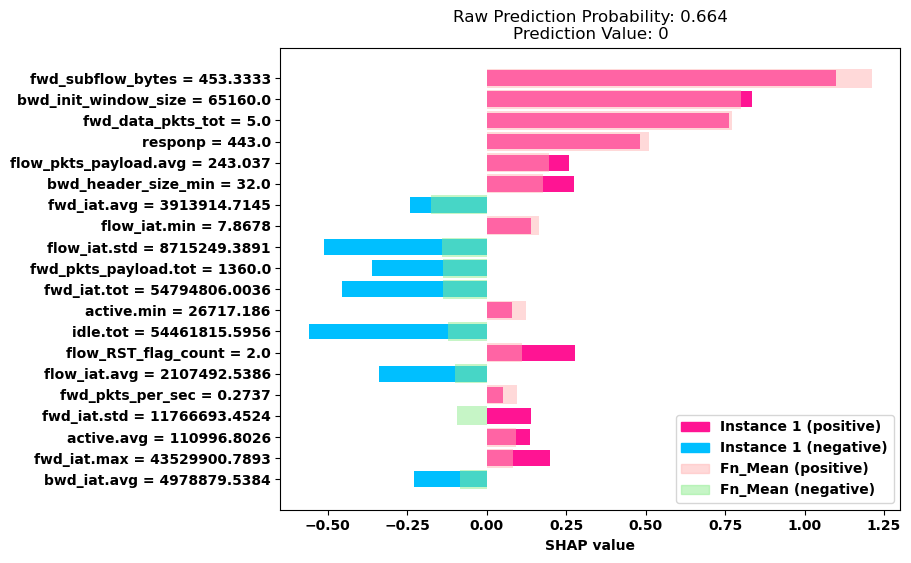

------------------------------------------------------------------------------------------------------------------------------------------------------


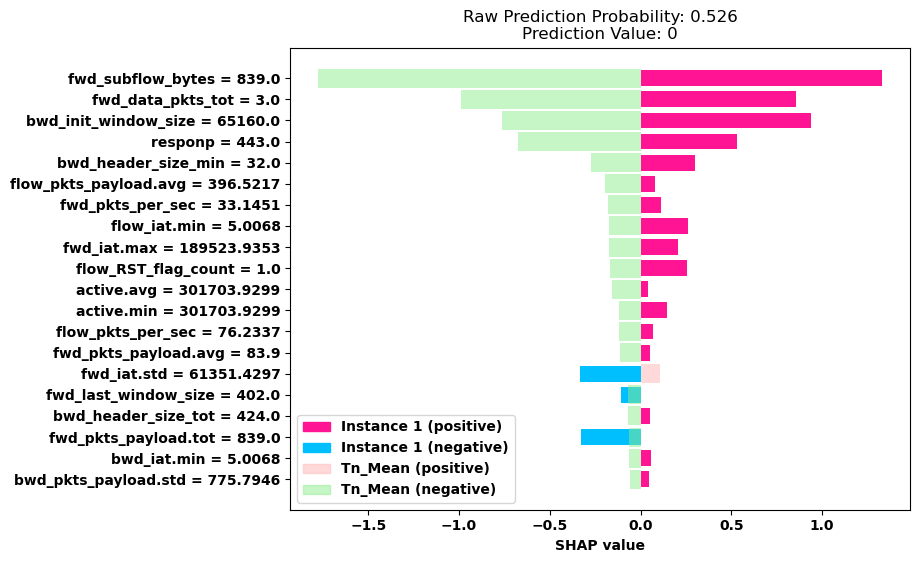

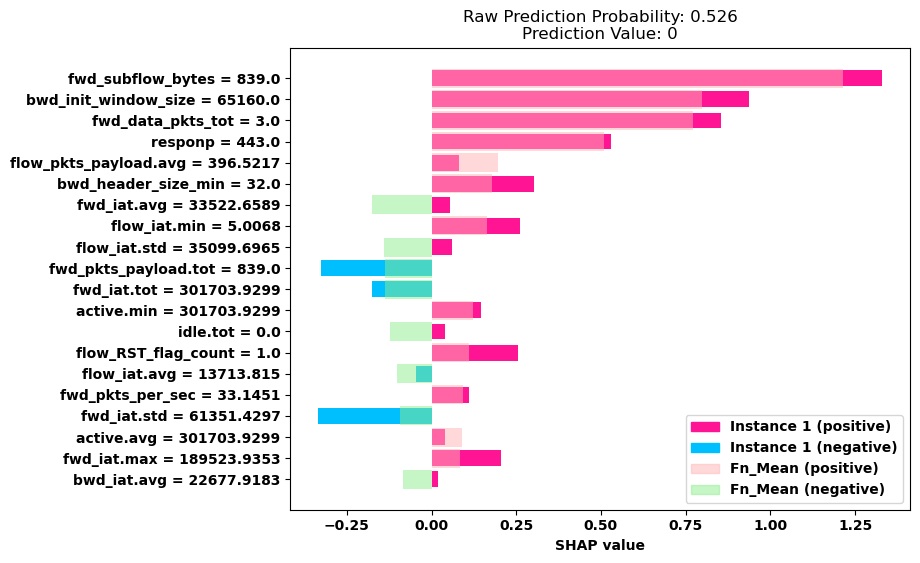

------------------------------------------------------------------------------------------------------------------------------------------------------


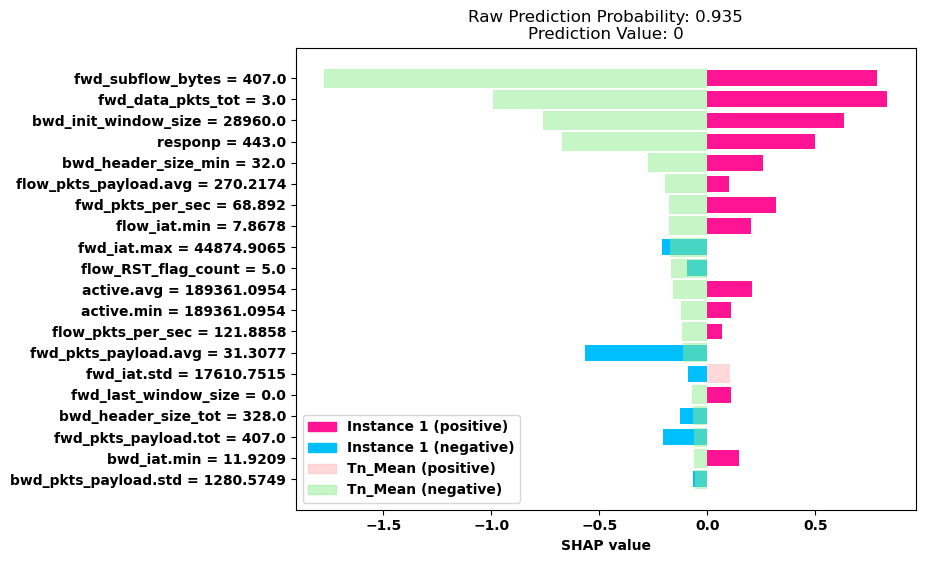

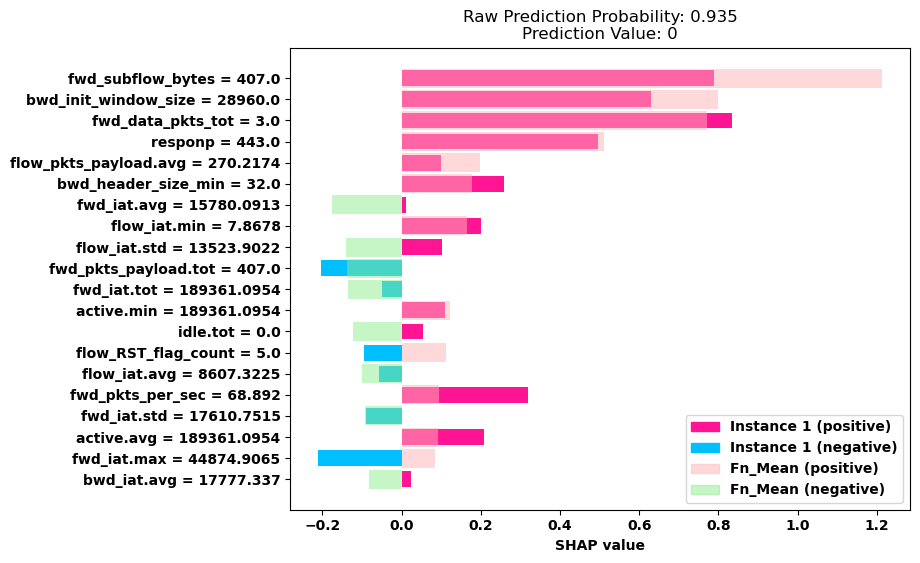

------------------------------------------------------------------------------------------------------------------------------------------------------


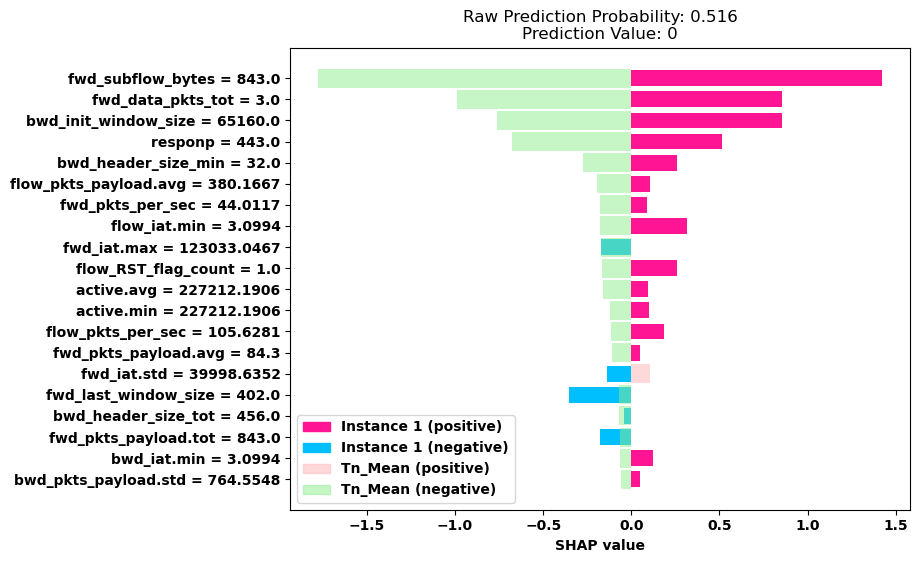

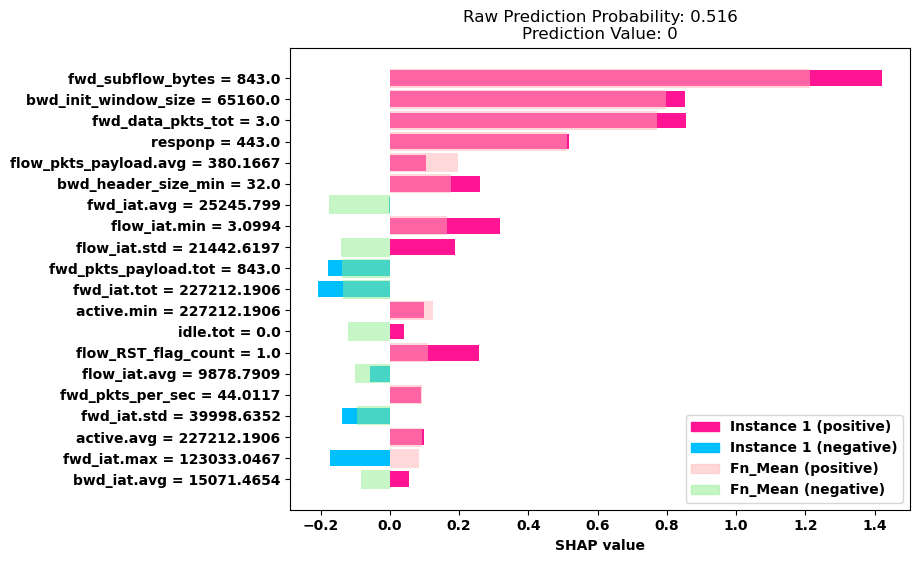

------------------------------------------------------------------------------------------------------------------------------------------------------


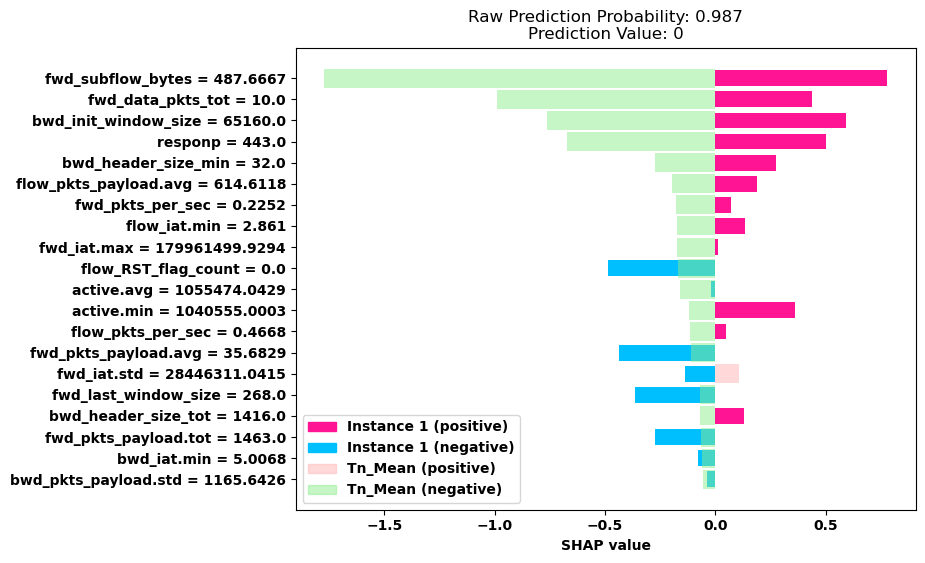

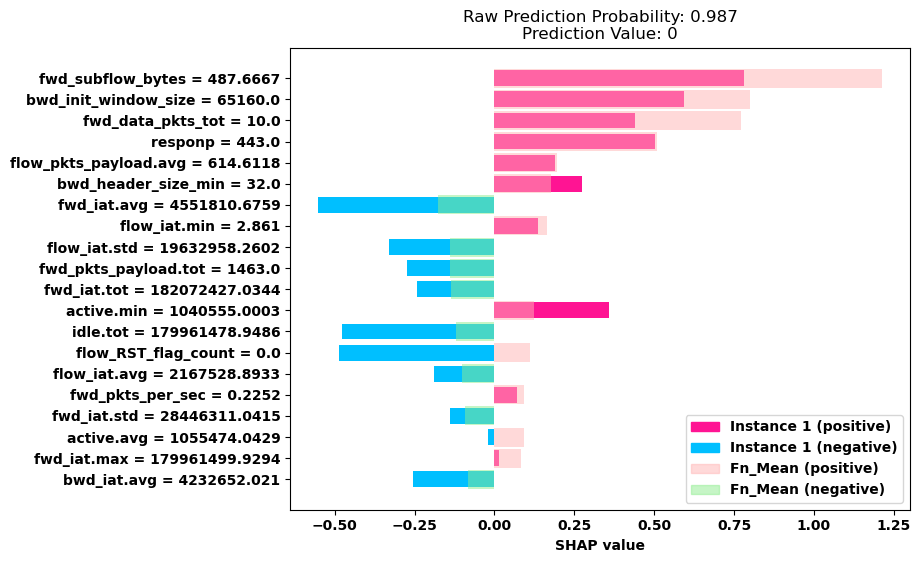

------------------------------------------------------------------------------------------------------------------------------------------------------


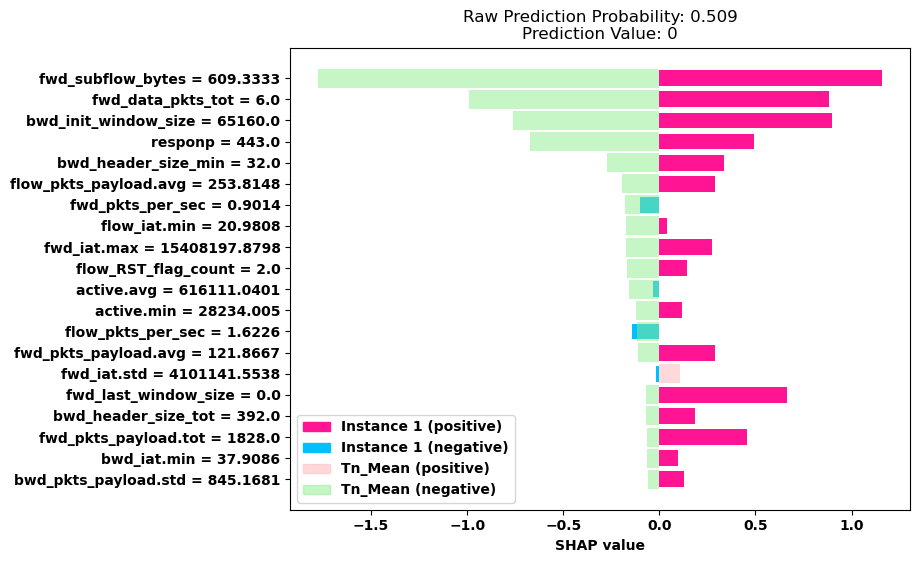

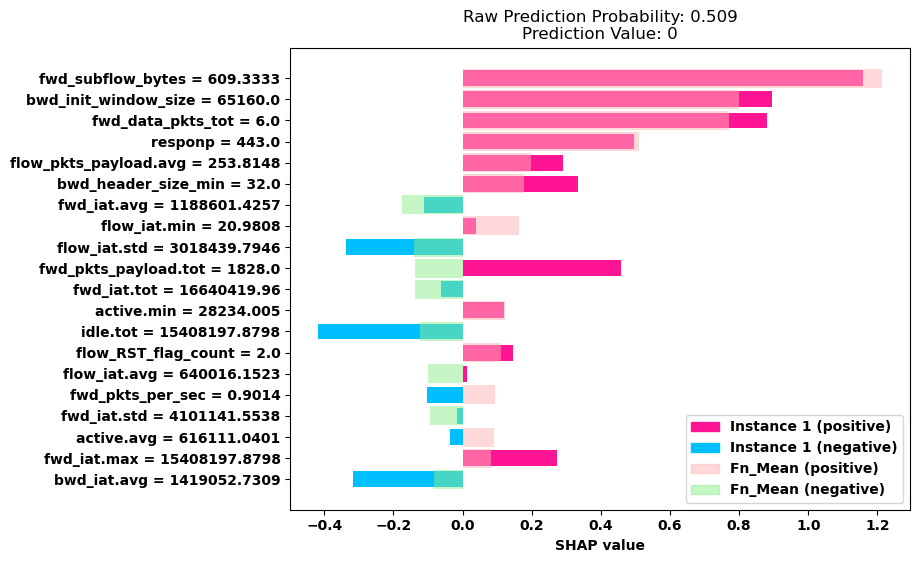

------------------------------------------------------------------------------------------------------------------------------------------------------


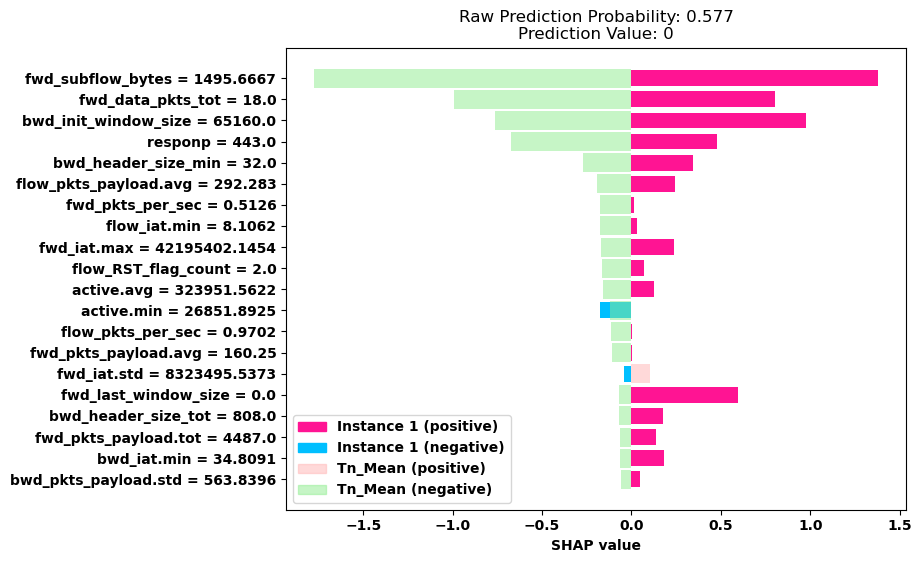

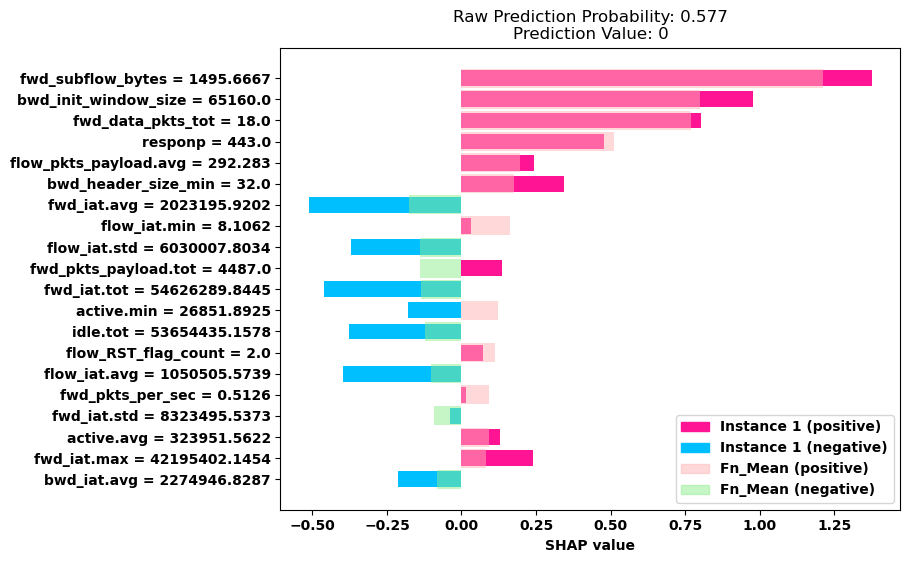

------------------------------------------------------------------------------------------------------------------------------------------------------


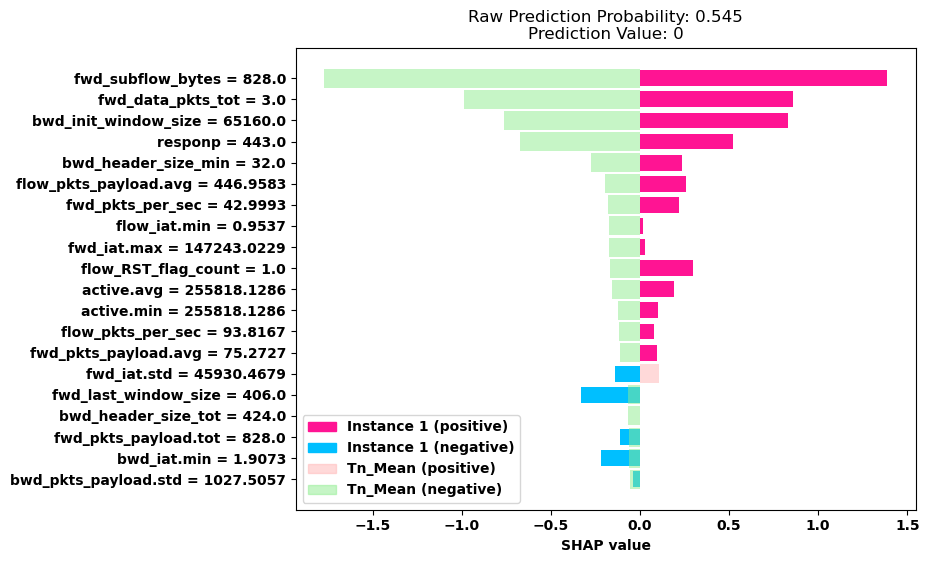

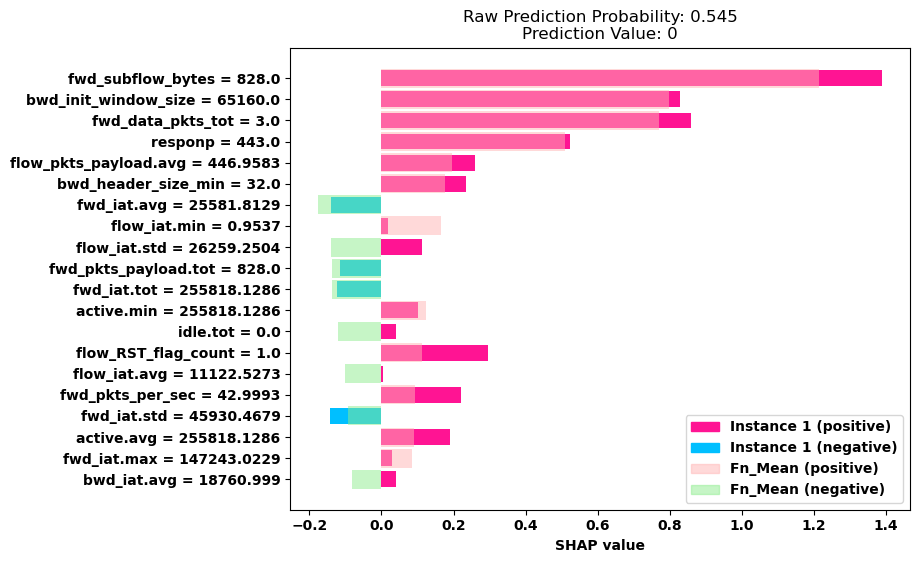

------------------------------------------------------------------------------------------------------------------------------------------------------


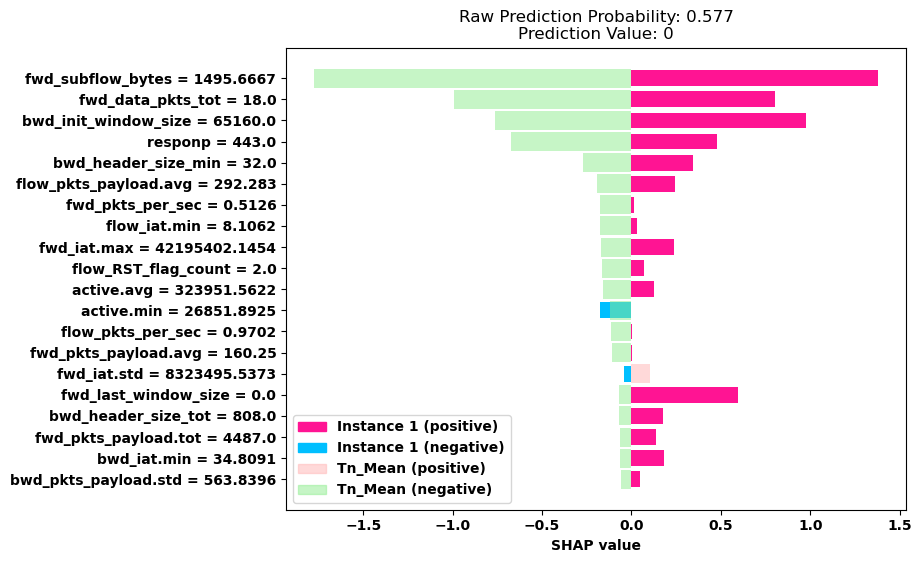

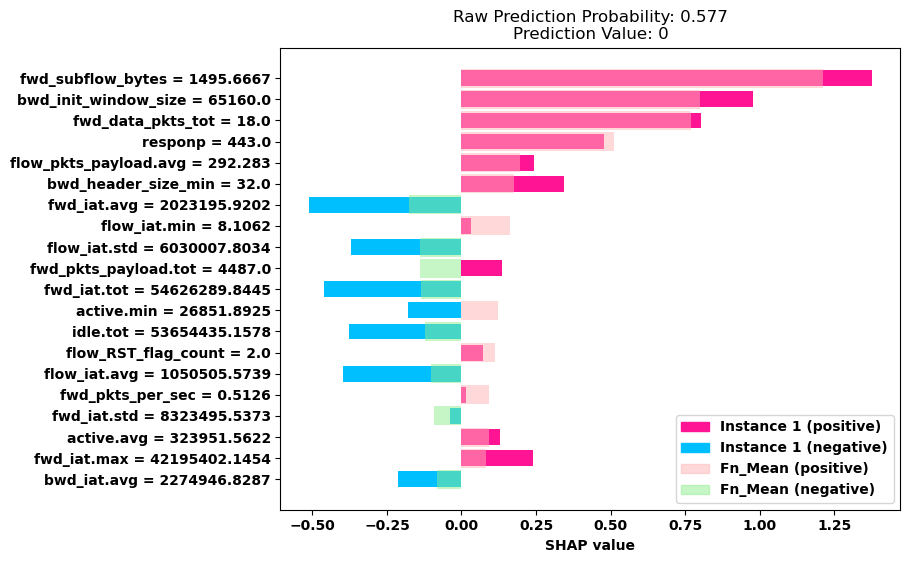

------------------------------------------------------------------------------------------------------------------------------------------------------


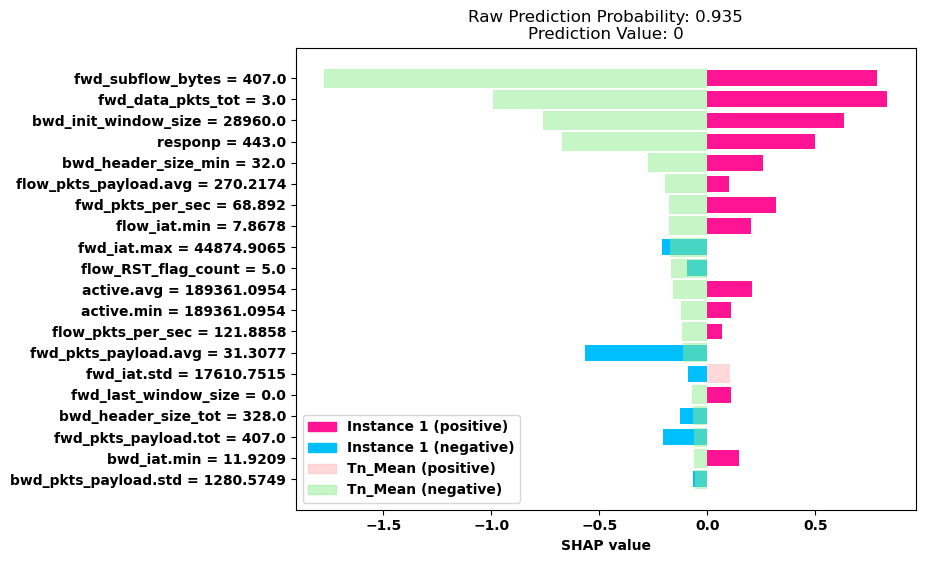

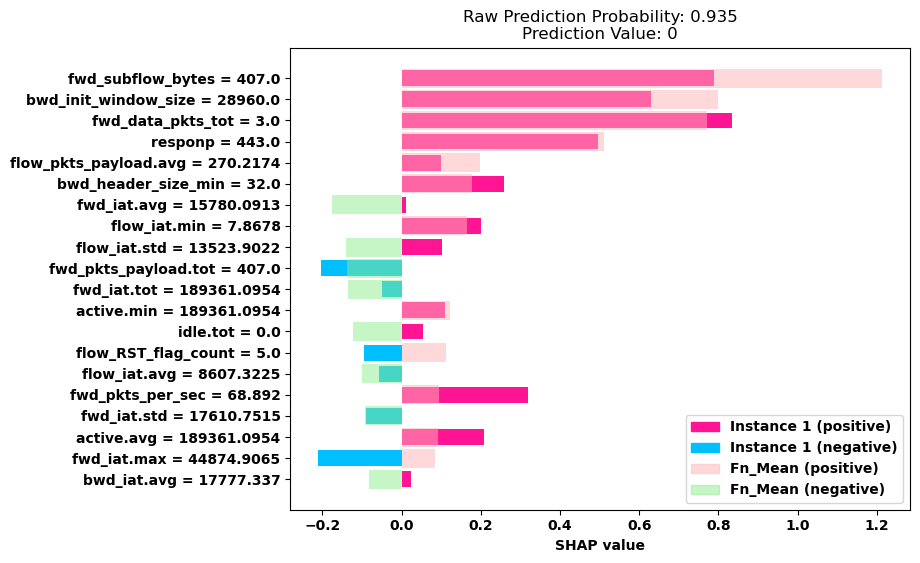

In [85]:
for i in range(10):
    print('-'*150)
    rand_idx = random.choice(fn_instances)
    fn_random_case = explainer(X_test[rand_idx])
    # print(np.abs(fn_random_case.values))
    plot_overlapping_shap(fn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], fn_random_case.data[tn_top_20_features], 'Tn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    # plot_overlapping_shap(fn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'TN_Mean')
    plot_overlapping_shap(fn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], fn_random_case.data[fn_top_20_features], 'Fn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    # plot_overlapping_shap(fn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], fn_random_case.data[fn_top_20_features], 'FN_Mean')
    plt.rcParams["figure.figsize"] = (8,6)
    plt.yticks(rotation=0)
    plt.rcParams.update({'font.size': 10,'font.weight':'bold'})
    plt.show()

In [88]:
tp_tn_random_size = 35
fp_fn_random_size = 15

random_35_tp_instances = np.random.choice(tp_instances, size=tp_tn_random_size, replace=False)
random_35_tn_instances = np.random.choice(tn_instances, size=tp_tn_random_size, replace=False)
random_15_fp_instances = np.random.choice(fp_instances, size=min(fp_fn_random_size, len(fp_instances)), replace=False)
random_15_fn_instances = np.random.choice(fn_instances, size=min(fp_fn_random_size, len(fn_instances)), replace=False)

print(random_35_tp_instances)
print(random_35_tn_instances)
print(random_15_fp_instances)
print(random_15_fn_instances)

[  772  2833  2521 14405 13165  6970  6547 14684  8254  4666 11600  8716
   785  2096  3954  4230   199  5267 12315 10438 11411 14423  3504  9552
  6026  5794   317 14939  6228 13863  2954  8400  9074 10527 10951]
[ 1328 13867 14379 12402 12250  9472 14320  5513  2086 14766  3779  5211
  1557   630 13220 11832  5274  5530  9167 10727  2773  4427 13911  3999
  1263 12242  5710  1754  4781  5468 13762 14080  6998 11389  8074]
[11288  1089  2476  9078  7734  7519  5099  4768 14843  6956 13585 10158
 14539  7241  1735]
[ 9395  4121  5452  6618 13992  7109  4368  4516  3476   688 14548 12729]


In [91]:
# [  772  2833  2521 14405 13165  6970  6547 14684  8254  4666 11600  8716
#    785  2096  3954  4230   199  5267 12315 10438 11411 14423  3504  9552
#   6026  5794   317 14939  6228 13863  2954  8400  9074 10527 10951]
# [ 1328 13867 14379 12402 12250  9472 14320  5513  2086 14766  3779  5211
#   1557   630 13220 11832  5274  5530  9167 10727  2773  4427 13911  3999
#   1263 12242  5710  1754  4781  5468 13762 14080  6998 11389  8074]
# [11288  1089  2476  9078  7734  7519  5099  4768 14843  6956 13585 10158
#  14539  7241  1735]
# [ 9395  4121  5452  6618 13992  7109  4368  4516  3476   688 14548 12729]

In [89]:
for i in random_15_fn_instances:
    rand_idx = i
    fn_random_case = explainer(X_test[rand_idx])

    plot_overlapping_shap(fn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], fn_random_case.data[tn_top_20_features], 'Tn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    plt.savefig('../Images/HIKARI21/'+str(i)+'_tn_compare.png')
    plt.close()
    plot_overlapping_shap(fn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], fn_random_case.data[fn_top_20_features], 'Fn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    plt.savefig('../Images/HIKARI21/'+str(i)+'_fn_compare.png')
    plt.close()

In [90]:
for i in random_35_tn_instances:
    rand_idx = i
    tn_random_case = explainer(X_test[rand_idx])

    plot_overlapping_shap(tn_random_case.values[tn_top_20_features], tn_shap_values_mean[tn_top_20_features], feature_names[tn_top_20_features], tn_random_case.data[tn_top_20_features], 'Tn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    plt.savefig('../Images/HIKARI21/'+str(i)+'_tn_compare.png')
    plt.close()
    plot_overlapping_shap(tn_random_case.values[fn_top_20_features], fn_shap_values_mean[fn_top_20_features], feature_names[fn_top_20_features], tn_random_case.data[fn_top_20_features], 'Fn_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    plt.savefig('../Images/HIKARI21/'+str(i)+'_fn_compare.png')
    plt.close()

In [92]:
for i in random_15_fp_instances:
    rand_idx = i
    fp_random_case = explainer(X_test[rand_idx])

    plot_overlapping_shap(fp_random_case.values[tp_top_20_features], tp_shap_values_mean[tp_top_20_features], feature_names[tp_top_20_features], fp_random_case.data[tp_top_20_features], 'Tp_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    plt.savefig('../Images/HIKARI21/'+str(i)+'_tp_compare.png')
    plt.close()
    plot_overlapping_shap(fp_random_case.values[fp_top_20_features], fp_shap_values_mean[fp_top_20_features], feature_names[fp_top_20_features], fp_random_case.data[fp_top_20_features], 'Fp_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    plt.savefig('../Images/HIKARI21/'+str(i)+'_fp_compare.png')
    plt.close()

In [93]:
for i in random_35_tp_instances:
    rand_idx = i
    tp_random_case = explainer(X_test[rand_idx])

    plot_overlapping_shap(tp_random_case.values[tp_top_20_features], tp_shap_values_mean[tp_top_20_features], feature_names[tp_top_20_features], tp_random_case.data[tp_top_20_features], 'Tp_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    plt.savefig('../Images/HIKARI21/'+str(i)+'_tp_compare.png')
    plt.close()
    plot_overlapping_shap(tp_random_case.values[fp_top_20_features], fp_shap_values_mean[fp_top_20_features], feature_names[fp_top_20_features], tp_random_case.data[fp_top_20_features], 'Fp_Mean', raw_prediction_prob=y_prob[rand_idx], pred_val=xgb_predicted_values[rand_idx])
    plt.savefig('../Images/HIKARI21/'+str(i)+'_fp_compare.png')
    plt.close()